In [1]:
%run IDM_helper_functions.ipynb

In [2]:

#os.chdir('/Users/wangjiashun/Documents/GitHub/sbi')
#os.getcwd() 

## Simulate from IDM5 and fit with OUM

In [3]:
n_trials = 1000
sim_num = 100

prior_IDM = utils.BoxUniform(low=[0,0.2,0.2,0.05, 52000, 8200], high=[1,0.6,0.5,0.05, 53000, 8600])
param_IDM = prior_IDM.sample((sim_num,))
valid_trials = []
choice_prop = []

In [4]:
par_fitted = np.zeros((sim_num,4))

for i in range(sim_num):
    print(i)
    IDM_o = simul_IDM_EM6(np.tile(param_IDM[i,:], (n_trials,1)), Bns = 2000, Bs = 500) # simulate IDM data
    print(param_IDM[i,:])
    print(IDM_o.mean(axis = 0))
    
    #Remove trials that is longer than 3s or undecided
    IDM_o = np.array(IDM_o[:,:])
    IDM_o = IDM_o[IDM_o[:,0]<=3,:]
    IDM_o = IDM_o[IDM_o[:,0]>=0.2,:]
    IDM_o = IDM_o[IDM_o[:,1]!=100,:]
    valid_trials.append(IDM_o.shape[0])
    choice_prop.append(IDM_o.mean(axis=0)[1])
    
    samp = Sample.from_numpy_array(IDM_o, column_names = [])
    
    model_fit = Model(name='Simple model (fitted)',
                      drift=DriftLinear(drift=Fittable(minval=0, maxval=6),
                                        t = 0,
                                        x=Fittable(minval=-20, maxval=20)),
                      noise=NoiseConstant(noise=1),
                      bound=BoundConstant(B=Fittable(minval=0.2, maxval=2)),
                      overlay=OverlayNonDecision(nondectime=Fittable(minval=0.1, maxval=1)),
                      dx=.001, dt=.001, T_dur=3)

    fit_adjust_model(samp, model_fit,
                     fitting_method="differential_evolution",
                     lossfunction=LossRobustBIC, verbose=False)
    
    par_fitted[i,0] = np.array(model_fit.parameters()['drift']['drift'])
    par_fitted[i,1] = np.array(model_fit.parameters()['bound']['B'])
    par_fitted[i,2] = np.array(model_fit.parameters()['overlay']['nondectime'])
    par_fitted[i,3] = np.array(model_fit.parameters()['drift']['x'])
    
    print(param_IDM[i,:])
    print(par_fitted[i,:])

0
sim0
tensor([3.4554e-01, 5.4644e-01, 4.2192e-01, 5.0000e-02, 5.2044e+04, 8.2559e+03])
tensor([0.5924, 0.8010])


Info: Params [1.61751682 3.63883234 0.49725525 0.42895209] gave -946.4047452368214


tensor([3.4554e-01, 5.4644e-01, 4.2192e-01, 5.0000e-02, 5.2044e+04, 8.2559e+03])
[1.61751682 0.49725525 0.42895209 3.63883234]
1
sim0
tensor([6.9383e-01, 5.9826e-01, 3.1098e-01, 5.0000e-02, 5.2581e+04, 8.5241e+03])
tensor([0.3753, 0.8470])


Info: Params [ 3.17318575 12.01606879  0.33219424  0.31392983] gave -3103.267590422364


tensor([6.9383e-01, 5.9826e-01, 3.1098e-01, 5.0000e-02, 5.2581e+04, 8.5241e+03])
[ 3.17318575  0.33219424  0.31392983 12.01606879]
2
sim0
tensor([8.8668e-02, 4.5892e-01, 4.8396e-01, 5.0000e-02, 5.2104e+04, 8.2698e+03])
tensor([0.7318, 0.5960])


Info: Params [0.41826843 4.48662504 0.61055253 0.50180612] gave 57.084812925947034


tensor([8.8668e-02, 4.5892e-01, 4.8396e-01, 5.0000e-02, 5.2104e+04, 8.2698e+03])
[0.41826843 0.61055253 0.50180612 4.48662504]
3
sim0
tensor([8.7310e-01, 5.4878e-01, 2.0439e-01, 5.0000e-02, 5.2861e+04, 8.4197e+03])
tensor([0.2782, 0.9070])


Info: Params [ 4.09061622 18.04401441  0.46132235  0.21149307] gave -3399.4658917886754


tensor([8.7310e-01, 5.4878e-01, 2.0439e-01, 5.0000e-02, 5.2861e+04, 8.4197e+03])
[ 4.09061622  0.46132235  0.21149307 18.04401441]
4
sim0
tensor([2.1506e-01, 4.6718e-01, 4.0207e-01, 5.0000e-02, 5.2777e+04, 8.2732e+03])
tensor([0.5324, 0.6370])


Info: Params [ 0.92303578 16.14913052  0.73217226  0.40866127] gave -1636.7771949967187


tensor([2.1506e-01, 4.6718e-01, 4.0207e-01, 5.0000e-02, 5.2777e+04, 8.2732e+03])
[ 0.92303578  0.73217226  0.40866127 16.14913052]
5
sim0
tensor([6.9795e-01, 3.6971e-01, 2.1243e-01, 5.0000e-02, 5.2493e+04, 8.5752e+03])
tensor([0.3621, 0.9190])


Info: Params [3.19308649 9.92579506 0.66843185 0.23753913] gave -2269.710270449407


tensor([6.9795e-01, 3.6971e-01, 2.1243e-01, 5.0000e-02, 5.2493e+04, 8.5752e+03])
[3.19308649 0.66843185 0.23753913 9.92579506]
6
sim0
tensor([4.4020e-01, 5.5385e-01, 4.5759e-01, 5.0000e-02, 5.2261e+04, 8.2204e+03])
tensor([0.5883, 0.8300])


Info: Params [2.07725921 4.46542275 0.43697914 0.46482839] gave -1587.6007722353547


tensor([4.4020e-01, 5.5385e-01, 4.5759e-01, 5.0000e-02, 5.2261e+04, 8.2204e+03])
[2.07725921 0.43697914 0.46482839 4.46542275]
7
sim0
tensor([4.4468e-01, 2.3826e-01, 4.6847e-01, 5.0000e-02, 5.2882e+04, 8.3081e+03])
tensor([0.6222, 0.7660])


Info: Params [ 2.0597179  17.21529524  0.94043473  0.49673994] gave -2067.485299006877


tensor([4.4468e-01, 2.3826e-01, 4.6847e-01, 5.0000e-02, 5.2882e+04, 8.3081e+03])
[ 2.0597179   0.94043473  0.49673994 17.21529524]
8
sim0
tensor([5.3980e-01, 2.7883e-01, 2.3739e-01, 5.0000e-02, 5.2162e+04, 8.5144e+03])
tensor([0.4660, 0.8880])


Info: Params [2.32182797 7.06069972 0.86740582 0.26620262] gave -1247.205028424978


tensor([5.3980e-01, 2.7883e-01, 2.3739e-01, 5.0000e-02, 5.2162e+04, 8.5144e+03])
[2.32182797 0.86740582 0.26620262 7.06069972]
9
sim0
tensor([2.7220e-02, 5.2006e-01, 2.5284e-01, 5.0000e-02, 5.2242e+04, 8.3585e+03])
tensor([0.4371, 0.5350])


Info: Params [0.18429365 7.29515715 0.60301353 0.25334827] gave -445.14043311678097


tensor([2.7220e-02, 5.2006e-01, 2.5284e-01, 5.0000e-02, 5.2242e+04, 8.3585e+03])
[0.18429365 0.60301353 0.25334827 7.29515715]
10
sim0
tensor([1.9507e-02, 3.2336e-01, 3.5197e-01, 5.0000e-02, 5.2376e+04, 8.3525e+03])
tensor([0.5696, 0.4750])


Info: Params [0.         9.64862003 0.89976821 0.36446008] gave -525.6324326633172


tensor([1.9507e-02, 3.2336e-01, 3.5197e-01, 5.0000e-02, 5.2376e+04, 8.3525e+03])
[0.         0.89976821 0.36446008 9.64862003]
11
sim0
tensor([2.3054e-01, 4.9003e-01, 4.2069e-01, 5.0000e-02, 5.2239e+04, 8.4496e+03])
tensor([0.6153, 0.7000])


Info: Params [1.02938248 6.96388518 0.62381975 0.43066534] gave -598.2155313356556


tensor([2.3054e-01, 4.9003e-01, 4.2069e-01, 5.0000e-02, 5.2239e+04, 8.4496e+03])
[1.02938248 0.62381975 0.43066534 6.96388518]
12
sim0
tensor([2.7852e-01, 5.5813e-01, 4.8106e-01, 5.0000e-02, 5.2494e+04, 8.4368e+03])
tensor([0.5973, 0.7290])


Info: Params [ 1.52385689 11.15708819  0.48794544  0.48453987] gave -1633.2246956592494


tensor([2.7852e-01, 5.5813e-01, 4.8106e-01, 5.0000e-02, 5.2494e+04, 8.4368e+03])
[ 1.52385689  0.48794544  0.48453987 11.15708819]
13
sim0
tensor([3.9566e-01, 3.4767e-01, 4.6073e-01, 5.0000e-02, 5.2215e+04, 8.4439e+03])
tensor([0.6765, 0.8570])


Info: Params [2.01976168 5.96695513 0.63177965 0.50132352] gave -1131.6673206626742


tensor([3.9566e-01, 3.4767e-01, 4.6073e-01, 5.0000e-02, 5.2215e+04, 8.4439e+03])
[2.01976168 0.63177965 0.50132352 5.96695513]
14
sim0
tensor([8.7111e-01, 4.5263e-01, 2.6699e-01, 5.0000e-02, 5.2001e+04, 8.2862e+03])
tensor([0.4165, 0.9790])


Info: Params [3.90023129 5.90988466 0.73080348 0.27890997] gave -2491.7326583662893


tensor([8.7111e-01, 4.5263e-01, 2.6699e-01, 5.0000e-02, 5.2001e+04, 8.2862e+03])
[3.90023129 0.73080348 0.27890997 5.90988466]
15
sim0
tensor([9.3781e-01, 5.6500e-01, 4.4413e-01, 5.0000e-02, 5.2672e+04, 8.2780e+03])
tensor([0.5147, 0.9340])


Info: Params [ 4.45513555 10.35063647  0.36406791  0.45378807] gave -3548.149605562672


tensor([9.3781e-01, 5.6500e-01, 4.4413e-01, 5.0000e-02, 5.2672e+04, 8.2780e+03])
[ 4.45513555  0.36406791  0.45378807 10.35063647]
16
sim0
tensor([8.4505e-02, 3.7532e-01, 2.9264e-01, 5.0000e-02, 5.2287e+04, 8.4919e+03])
tensor([0.5212, 0.5840])


Info: Params [0.42436805 8.07054531 0.77374657 0.31104024] gave -351.1513460225089


tensor([8.4505e-02, 3.7532e-01, 2.9264e-01, 5.0000e-02, 5.2287e+04, 8.4919e+03])
[0.42436805 0.77374657 0.31104024 8.07054531]
17
sim0
tensor([1.8892e-03, 5.3165e-01, 2.7177e-01, 5.0000e-02, 5.2468e+04, 8.2330e+03])
tensor([0.4129, 0.5190])


Info: Params [0.10525029 8.94355273 0.49265428 0.277885  ] gave -1012.681534194241


tensor([1.8892e-03, 5.3165e-01, 2.7177e-01, 5.0000e-02, 5.2468e+04, 8.2330e+03])
[0.10525029 0.49265428 0.277885   8.94355273]
18
sim0
tensor([6.4875e-02, 2.4495e-01, 3.4846e-01, 5.0000e-02, 5.2775e+04, 8.5473e+03])
tensor([0.5287, 0.5490])


Info: Params [ 0.37183382 14.7105216   0.82430194  0.3847418 ] gave -1293.1689030473112


tensor([6.4875e-02, 2.4495e-01, 3.4846e-01, 5.0000e-02, 5.2775e+04, 8.5473e+03])
[ 0.37183382  0.82430194  0.3847418  14.7105216 ]
19
sim0
tensor([1.4244e-01, 2.6374e-01, 2.6121e-01, 5.0000e-02, 5.2447e+04, 8.2370e+03])
tensor([0.4693, 0.6140])


Info: Params [ 0.70764276 10.3904529   0.79279532  0.29460034] gave -891.6162864427652


tensor([1.4244e-01, 2.6374e-01, 2.6121e-01, 5.0000e-02, 5.2447e+04, 8.2370e+03])
[ 0.70764276  0.79279532  0.29460034 10.3904529 ]
20
sim0
tensor([8.5247e-01, 3.6016e-01, 2.6989e-01, 5.0000e-02, 5.2228e+04, 8.2795e+03])
tensor([0.4263, 0.9620])


Info: Params [3.74560569 8.91413424 0.87696724 0.28565656] gave -2449.5822316385043


tensor([8.5247e-01, 3.6016e-01, 2.6989e-01, 5.0000e-02, 5.2228e+04, 8.2795e+03])
[3.74560569 0.87696724 0.28565656 8.91413424]
21
sim0
tensor([9.2533e-02, 5.1917e-01, 3.4254e-01, 5.0000e-02, 5.2710e+04, 8.5055e+03])
tensor([0.4693, 0.5710])


Info: Params [ 0.48880313 13.64123936  0.56332698  0.3492997 ] gave -1395.605483392812


tensor([9.2533e-02, 5.1917e-01, 3.4254e-01, 5.0000e-02, 5.2710e+04, 8.5055e+03])
[ 0.48880313  0.56332698  0.3492997  13.64123936]
22
sim0
tensor([6.5181e-02, 5.6347e-01, 4.2906e-01, 5.0000e-02, 5.2578e+04, 8.2851e+03])
tensor([0.5356, 0.5330])


Info: Params [ 0.16315624 15.13111791  0.51608154  0.42955873] gave -1619.6663031547146


tensor([6.5181e-02, 5.6347e-01, 4.2906e-01, 5.0000e-02, 5.2578e+04, 8.2851e+03])
[ 0.16315624  0.51608154  0.42955873 15.13111791]
23
sim0
tensor([2.0195e-01, 3.3373e-01, 4.1177e-01, 5.0000e-02, 5.2841e+04, 8.4577e+03])
tensor([0.5654, 0.6300])


Info: Params [ 0.84161574 15.98492067  0.86895019  0.4293007 ] gave -1555.0746319368177


tensor([2.0195e-01, 3.3373e-01, 4.1177e-01, 5.0000e-02, 5.2841e+04, 8.4577e+03])
[ 0.84161574  0.86895019  0.4293007  15.98492067]
24
sim0
tensor([2.1286e-01, 4.7488e-01, 3.8724e-01, 5.0000e-02, 5.2740e+04, 8.4717e+03])
tensor([0.5264, 0.6310])


Info: Params [ 0.85148514 13.2697819   0.58942847  0.40113672] gave -1391.3950320016775


tensor([2.1286e-01, 4.7488e-01, 3.8724e-01, 5.0000e-02, 5.2740e+04, 8.4717e+03])
[ 0.85148514  0.58942847  0.40113672 13.2697819 ]
25
sim0
tensor([2.5799e-01, 2.8836e-01, 3.9933e-01, 5.0000e-02, 5.2948e+04, 8.2819e+03])
tensor([0.5458, 0.6700])


Info: Params [ 1.32265565 19.18130164  0.99179627  0.42192291] gave -1955.2971024276248


tensor([2.5799e-01, 2.8836e-01, 3.9933e-01, 5.0000e-02, 5.2948e+04, 8.2819e+03])
[ 1.32265565  0.99179627  0.42192291 19.18130164]
26
sim0
tensor([9.5157e-01, 2.7491e-01, 2.3802e-01, 5.0000e-02, 5.2185e+04, 8.3657e+03])
tensor([0.4028, 0.9810])


Info: Params [4.24872597 7.97623116 1.11939611 0.24714918] gave -2659.5873332671968


tensor([9.5157e-01, 2.7491e-01, 2.3802e-01, 5.0000e-02, 5.2185e+04, 8.3657e+03])
[4.24872597 1.11939611 0.24714918 7.97623116]
27
sim0
tensor([4.8412e-01, 4.0286e-01, 2.5468e-01, 5.0000e-02, 5.2924e+04, 8.2104e+03])
tensor([0.3746, 0.7940])


Info: Params [ 2.38264627 17.55878802  0.72660979  0.2682818 ] gave -2297.8087799472505


tensor([4.8412e-01, 4.0286e-01, 2.5468e-01, 5.0000e-02, 5.2924e+04, 8.2104e+03])
[ 2.38264627  0.72660979  0.2682818  17.55878802]
28
sim0
tensor([1.9786e-01, 3.0212e-01, 4.2591e-01, 5.0000e-02, 5.2479e+04, 8.4622e+03])
tensor([0.6289, 0.6130])


Info: Params [ 0.68286802 10.75552656  0.75713759  0.45966222] gave -904.3032604171941


tensor([1.9786e-01, 3.0212e-01, 4.2591e-01, 5.0000e-02, 5.2479e+04, 8.4622e+03])
[ 0.68286802  0.75713759  0.45966222 10.75552656]
29
sim0
tensor([4.1277e-01, 4.2312e-01, 2.9060e-01, 5.0000e-02, 5.2988e+04, 8.3619e+03])
tensor([0.4078, 0.7460])


Info: Params [ 2.02445417 19.42517466  0.77231142  0.30241599] gave -2234.2221688587447


tensor([4.1277e-01, 4.2312e-01, 2.9060e-01, 5.0000e-02, 5.2988e+04, 8.3619e+03])
[ 2.02445417  0.77231142  0.30241599 19.42517466]
30
sim0
tensor([9.8837e-01, 4.6053e-01, 4.5618e-01, 5.0000e-02, 5.2310e+04, 8.2699e+03])
tensor([0.5766, 0.9760])


Info: Params [4.32716751 8.19068385 0.67649241 0.46558798] gave -2936.051498766847


tensor([9.8837e-01, 4.6053e-01, 4.5618e-01, 5.0000e-02, 5.2310e+04, 8.2699e+03])
[4.32716751 0.67649241 0.46558798 8.19068385]
31
sim0
tensor([1.5291e-02, 2.6855e-01, 3.0330e-01, 5.0000e-02, 5.2282e+04, 8.2959e+03])
tensor([0.5445, 0.4960])


Info: Params [0.         8.04446091 0.65650301 0.35614266] gave -452.80386408626816


tensor([1.5291e-02, 2.6855e-01, 3.0330e-01, 5.0000e-02, 5.2282e+04, 8.2959e+03])
[0.         0.65650301 0.35614266 8.04446091]
32
sim0
tensor([3.2564e-01, 5.9180e-01, 2.7420e-01, 5.0000e-02, 5.2131e+04, 8.4452e+03])
tensor([0.3846, 0.7320])


Info: Params [1.47983371 3.55056367 0.36640827 0.27658327] gave -1544.830803963995


tensor([3.2564e-01, 5.9180e-01, 2.7420e-01, 5.0000e-02, 5.2131e+04, 8.4452e+03])
[1.47983371 0.36640827 0.27658327 3.55056367]
33
sim0
tensor([5.4242e-02, 3.7739e-01, 2.1563e-01, 5.0000e-02, 5.2639e+04, 8.2526e+03])
tensor([0.3802, 0.5380])


Info: Params [ 0.20195346 13.57417133  0.70729376  0.2402878 ] gave -1243.2960039286813


tensor([5.4242e-02, 3.7739e-01, 2.1563e-01, 5.0000e-02, 5.2639e+04, 8.2526e+03])
[ 0.20195346  0.70729376  0.2402878  13.57417133]
34
sim0
tensor([5.6806e-01, 2.3318e-01, 3.3867e-01, 5.0000e-02, 5.2767e+04, 8.2972e+03])
tensor([0.4948, 0.8580])


Info: Params [ 2.95174893 16.3354089   1.23374826  0.35982175] gave -2372.0593680793577


tensor([5.6806e-01, 2.3318e-01, 3.3867e-01, 5.0000e-02, 5.2767e+04, 8.2972e+03])
[ 2.95174893  1.23374826  0.35982175 16.3354089 ]
35
sim0
tensor([1.5482e-01, 3.9766e-01, 3.8871e-01, 5.0000e-02, 5.2587e+04, 8.3869e+03])
tensor([0.5591, 0.6140])


Info: Params [ 0.68212962 11.6970699   0.66041608  0.41281536] gave -1107.8863569265109


tensor([1.5482e-01, 3.9766e-01, 3.8871e-01, 5.0000e-02, 5.2587e+04, 8.3869e+03])
[ 0.68212962  0.66041608  0.41281536 11.6970699 ]
36
sim0
tensor([6.5522e-01, 5.4237e-01, 2.1720e-01, 5.0000e-02, 5.2814e+04, 8.2531e+03])
tensor([0.3023, 0.8600])


Info: Params [ 3.16730839 16.17299586  0.47809087  0.22297558] gave -2809.9467793517297


tensor([6.5522e-01, 5.4237e-01, 2.1720e-01, 5.0000e-02, 5.2814e+04, 8.2531e+03])
[ 3.16730839  0.47809087  0.22297558 16.17299586]
37
sim0
tensor([9.4724e-02, 3.4131e-01, 3.5383e-01, 5.0000e-02, 5.2837e+04, 8.4301e+03])
tensor([0.5058, 0.5610])


Info: Params [ 0.45147321 14.98285634  0.64473688  0.38599824] gave -1583.386293378243


tensor([9.4724e-02, 3.4131e-01, 3.5383e-01, 5.0000e-02, 5.2837e+04, 8.4301e+03])
[ 0.45147321  0.64473688  0.38599824 14.98285634]
38
sim0
tensor([9.3598e-01, 3.4749e-01, 3.3996e-01, 5.0000e-02, 5.2408e+04, 8.2436e+03])
tensor([0.4764, 0.9700])


Info: Params [ 4.33085807 10.37801633  0.84717269  0.35893422] gave -2944.7456116553303


tensor([9.3598e-01, 3.4749e-01, 3.3996e-01, 5.0000e-02, 5.2408e+04, 8.2436e+03])
[ 4.33085807  0.84717269  0.35893422 10.37801633]
39
sim0
tensor([4.7769e-02, 5.9465e-01, 4.1332e-01, 5.0000e-02, 5.2848e+04, 8.5298e+03])
tensor([0.4787, 0.5100])


Info: Params [ 0.09316931 19.03761209  0.31280803  0.41923246] gave -2603.1960901723164


tensor([4.7769e-02, 5.9465e-01, 4.1332e-01, 5.0000e-02, 5.2848e+04, 8.5298e+03])
[ 0.09316931  0.31280803  0.41923246 19.03761209]
40
sim0
tensor([8.9259e-02, 5.1540e-01, 3.7576e-01, 5.0000e-02, 5.2846e+04, 8.4840e+03])
tensor([0.4904, 0.5400])


Info: Params [ 0.2634759  15.85835344  0.57771083  0.37973976] gave -1624.236822820655


tensor([8.9259e-02, 5.1540e-01, 3.7576e-01, 5.0000e-02, 5.2846e+04, 8.4840e+03])
[ 0.2634759   0.57771083  0.37973976 15.85835344]
41
sim0
tensor([8.2192e-01, 5.3168e-01, 4.7578e-01, 5.0000e-02, 5.2795e+04, 8.2271e+03])
tensor([0.5590, 0.9010])


Info: Params [ 3.68400486 13.72404378  0.43682173  0.48571487] gave -3108.495593694623


tensor([8.2192e-01, 5.3168e-01, 4.7578e-01, 5.0000e-02, 5.2795e+04, 8.2271e+03])
[ 3.68400486  0.43682173  0.48571487 13.72404378]
42
sim0
tensor([6.7725e-01, 4.3379e-01, 2.0759e-01, 5.0000e-02, 5.2684e+04, 8.3634e+03])
tensor([0.3295, 0.8900])


Info: Params [ 3.26801565 14.10696656  0.63150636  0.22855077] gave -2574.663736302739


tensor([6.7725e-01, 4.3379e-01, 2.0759e-01, 5.0000e-02, 5.2684e+04, 8.3634e+03])
[ 3.26801565  0.63150636  0.22855077 14.10696656]
43
sim0
tensor([9.0084e-01, 4.8417e-01, 2.1850e-01, 5.0000e-02, 5.2577e+04, 8.4841e+03])
tensor([0.3238, 0.9500])


Info: Params [4.04607897 9.40951817 0.50991296 0.2348994 ] gave -2977.354265695229


tensor([9.0084e-01, 4.8417e-01, 2.1850e-01, 5.0000e-02, 5.2577e+04, 8.4841e+03])
[4.04607897 0.50991296 0.2348994  9.40951817]
44
sim0
tensor([4.7183e-01, 5.0969e-01, 3.1433e-01, 5.0000e-02, 5.2413e+04, 8.3305e+03])
tensor([0.4526, 0.8380])


Info: Params [2.03413347 9.3997207  0.59258954 0.32001438] gave -1694.1916302272257


tensor([4.7183e-01, 5.0969e-01, 3.1433e-01, 5.0000e-02, 5.2413e+04, 8.3305e+03])
[2.03413347 0.59258954 0.32001438 9.3997207 ]
45
sim0
tensor([7.9738e-01, 4.2988e-01, 2.3426e-01, 5.0000e-02, 5.2358e+04, 8.3059e+03])
tensor([0.3730, 0.9470])


Info: Params [3.56458816 8.78397611 0.65123282 0.25277773] gave -2474.2004509803073


tensor([7.9738e-01, 4.2988e-01, 2.3426e-01, 5.0000e-02, 5.2358e+04, 8.3059e+03])
[3.56458816 0.65123282 0.25277773 8.78397611]
46
sim0
tensor([9.7808e-02, 5.5118e-01, 3.4616e-01, 5.0000e-02, 5.2047e+04, 8.4782e+03])
tensor([0.5548, 0.6090])


Info: Params [0.49264468 1.97194539 0.48459698 0.35437171] gave -130.93261849819962


tensor([9.7808e-02, 5.5118e-01, 3.4616e-01, 5.0000e-02, 5.2047e+04, 8.4782e+03])
[0.49264468 0.48459698 0.35437171 1.97194539]
47
sim0
tensor([4.2435e-01, 4.8498e-01, 4.4115e-01, 5.0000e-02, 5.2773e+04, 8.5970e+03])
tensor([0.5631, 0.7840])


Info: Params [ 2.04681361 14.27723198  0.62501973  0.44991204] gave -1972.7993142429914


tensor([4.2435e-01, 4.8498e-01, 4.4115e-01, 5.0000e-02, 5.2773e+04, 8.5970e+03])
[ 2.04681361  0.62501973  0.44991204 14.27723198]
48
sim0
tensor([9.7513e-01, 5.7790e-01, 3.0348e-01, 5.0000e-02, 5.2788e+04, 8.5582e+03])
tensor([0.3658, 0.9210])


Info: Params [ 4.41191156 12.47951545  0.35313656  0.30850077] gave -3653.222459856127


tensor([9.7513e-01, 5.7790e-01, 3.0348e-01, 5.0000e-02, 5.2788e+04, 8.5582e+03])
[ 4.41191156  0.35313656  0.30850077 12.47951545]
49
sim0
tensor([4.1370e-01, 4.6977e-01, 4.9212e-01, 5.0000e-02, 5.2820e+04, 8.5986e+03])
tensor([0.6212, 0.7740])


Info: Params [ 1.9364486  13.49180505  0.57265011  0.50788891] gave -1865.746582311675


tensor([4.1370e-01, 4.6977e-01, 4.9212e-01, 5.0000e-02, 5.2820e+04, 8.5986e+03])
[ 1.9364486   0.57265011  0.50788891 13.49180505]
50
sim0
tensor([1.0183e-01, 4.9772e-01, 4.3418e-01, 5.0000e-02, 5.2207e+04, 8.4167e+03])
tensor([0.6449, 0.5990])


Info: Params [0.43025103 2.72842206 0.53664594 0.44108379] gave -168.68154645657353


tensor([1.0183e-01, 4.9772e-01, 4.3418e-01, 5.0000e-02, 5.2207e+04, 8.4167e+03])
[0.43025103 0.53664594 0.44108379 2.72842206]
51
sim0
tensor([8.2365e-01, 2.8407e-01, 2.9725e-01, 5.0000e-02, 5.2511e+04, 8.5846e+03])
tensor([0.4489, 0.9380])


Info: Params [ 3.6276382  11.82868678  0.92112336  0.31911189] gave -2595.4086736320914


tensor([8.2365e-01, 2.8407e-01, 2.9725e-01, 5.0000e-02, 5.2511e+04, 8.5846e+03])
[ 3.6276382   0.92112336  0.31911189 11.82868678]
52
sim0
tensor([1.5068e-01, 3.8215e-01, 2.7016e-01, 5.0000e-02, 5.2697e+04, 8.5419e+03])
tensor([0.4322, 0.6180])


Info: Params [ 0.66792782 11.67655719  0.68811604  0.28886983] gave -1255.056993829512


tensor([1.5068e-01, 3.8215e-01, 2.7016e-01, 5.0000e-02, 5.2697e+04, 8.5419e+03])
[ 0.66792782  0.68811604  0.28886983 11.67655719]
53
sim0
tensor([7.2188e-01, 4.8296e-01, 3.7460e-01, 5.0000e-02, 5.2935e+04, 8.5855e+03])
tensor([0.4730, 0.8700])


Info: Params [ 3.25064728 15.96822181  0.48945085  0.39334903] gave -2850.2354759829545


tensor([7.2188e-01, 4.8296e-01, 3.7460e-01, 5.0000e-02, 5.2935e+04, 8.5855e+03])
[ 3.25064728  0.48945085  0.39334903 15.96822181]
54
sim0
tensor([4.7891e-01, 2.7142e-01, 3.4318e-01, 5.0000e-02, 5.2030e+04, 8.3438e+03])
tensor([0.6079, 0.8990])


Info: Params [2.11905411 4.61627945 0.74255629 0.38963561] gave -901.370102180994


tensor([4.7891e-01, 2.7142e-01, 3.4318e-01, 5.0000e-02, 5.2030e+04, 8.3438e+03])
[2.11905411 0.74255629 0.38963561 4.61627945]
55
sim0
tensor([5.1192e-01, 5.1271e-01, 3.4207e-01, 5.0000e-02, 5.2628e+04, 8.4286e+03])
tensor([0.4620, 0.8300])


Info: Params [ 2.3591797  11.28307248  0.51537335  0.35467326] gave -2041.3152882026625


tensor([5.1192e-01, 5.1271e-01, 3.4207e-01, 5.0000e-02, 5.2628e+04, 8.4286e+03])
[ 2.3591797   0.51537335  0.35467326 11.28307248]
56
sim0
tensor([2.7594e-01, 4.3577e-01, 2.4098e-01, 5.0000e-02, 5.2136e+04, 8.5075e+03])
tensor([0.4798, 0.7960])


Info: Params [1.46972988 6.01511712 0.78974703 0.24896958] gave -464.25097400449056


tensor([2.7594e-01, 4.3577e-01, 2.4098e-01, 5.0000e-02, 5.2136e+04, 8.5075e+03])
[1.46972988 0.78974703 0.24896958 6.01511712]
57
sim0
tensor([8.5096e-01, 5.2568e-01, 2.9355e-01, 5.0000e-02, 5.2750e+04, 8.5979e+03])
tensor([0.3851, 0.9250])


Info: Params [ 3.85028851 12.58241528  0.50075372  0.30285561] gave -3012.868102792577


tensor([8.5096e-01, 5.2568e-01, 2.9355e-01, 5.0000e-02, 5.2750e+04, 8.5979e+03])
[ 3.85028851  0.50075372  0.30285561 12.58241528]
58
sim0
tensor([8.1578e-01, 3.3749e-01, 2.0048e-01, 5.0000e-02, 5.2496e+04, 8.2860e+03])
tensor([0.3411, 0.9410])


Info: Params [ 3.80025461 12.53351097  1.04196437  0.20801082] gave -2681.84354333801


tensor([8.1578e-01, 3.3749e-01, 2.0048e-01, 5.0000e-02, 5.2496e+04, 8.2860e+03])
[ 3.80025461  1.04196437  0.20801082 12.53351097]
59
sim0
tensor([7.1696e-02, 4.2552e-01, 3.8746e-01, 5.0000e-02, 5.2894e+04, 8.5397e+03])
tensor([0.5262, 0.5320])


Info: Params [ 0.18030774 16.13560552  0.67756029  0.4040457 ] gave -1519.7511667695635


tensor([7.1696e-02, 4.2552e-01, 3.8746e-01, 5.0000e-02, 5.2894e+04, 8.5397e+03])
[ 0.18030774  0.67756029  0.4040457  16.13560552]
60
sim0
tensor([6.6905e-01, 2.3719e-01, 3.0014e-01, 5.0000e-02, 5.2480e+04, 8.5957e+03])
tensor([0.4792, 0.9100])


Info: Params [2.97892763 9.83826817 0.73213545 0.34266737] gave -2087.456252006962


tensor([6.6905e-01, 2.3719e-01, 3.0014e-01, 5.0000e-02, 5.2480e+04, 8.5957e+03])
[2.97892763 0.73213545 0.34266737 9.83826817]
61
sim0
tensor([7.6921e-01, 4.7662e-01, 2.0252e-01, 5.0000e-02, 5.2665e+04, 8.3401e+03])
tensor([0.3140, 0.9090])


Info: Params [ 3.49712938 14.21804874  0.67479707  0.21288384] gave -2668.1844260737757


tensor([7.6921e-01, 4.7662e-01, 2.0252e-01, 5.0000e-02, 5.2665e+04, 8.3401e+03])
[ 3.49712938  0.67479707  0.21288384 14.21804874]
62
sim0
tensor([5.0667e-01, 3.4166e-01, 4.6481e-01, 5.0000e-02, 5.2453e+04, 8.5252e+03])
tensor([0.6415, 0.8680])


Info: Params [2.39968791 9.71561237 0.79832506 0.4852214 ] gave -1658.4535522506217


tensor([5.0667e-01, 3.4166e-01, 4.6481e-01, 5.0000e-02, 5.2453e+04, 8.5252e+03])
[2.39968791 0.79832506 0.4852214  9.71561237]
63
sim0
tensor([5.0537e-01, 4.7516e-01, 3.2482e-01, 5.0000e-02, 5.2853e+04, 8.4887e+03])
tensor([0.4379, 0.8200])


Info: Params [ 2.6012291  16.16540027  0.6260329   0.3365386 ] gave -2311.392828329177


tensor([5.0537e-01, 4.7516e-01, 3.2482e-01, 5.0000e-02, 5.2853e+04, 8.4887e+03])
[ 2.6012291   0.6260329   0.3365386  16.16540027]
64
sim0
tensor([7.8848e-01, 3.6089e-01, 2.6382e-01, 5.0000e-02, 5.2750e+04, 8.2916e+03])
tensor([0.3897, 0.9040])


Info: Params [ 3.55361713 15.35750029  0.84541117  0.27970868] gave -2739.5932568293715


tensor([7.8848e-01, 3.6089e-01, 2.6382e-01, 5.0000e-02, 5.2750e+04, 8.2916e+03])
[ 3.55361713  0.84541117  0.27970868 15.35750029]
65
sim0
tensor([2.5240e-01, 4.8411e-01, 3.6910e-01, 5.0000e-02, 5.2429e+04, 8.3963e+03])
tensor([0.5340, 0.7230])


Info: Params [1.27860495 9.09192464 0.62116673 0.37661806] gave -1019.2093697380107


tensor([2.5240e-01, 4.8411e-01, 3.6910e-01, 5.0000e-02, 5.2429e+04, 8.3963e+03])
[1.27860495 0.62116673 0.37661806 9.09192464]
66
sim0
tensor([3.0277e-01, 5.2562e-01, 2.3588e-01, 5.0000e-02, 5.2050e+04, 8.5628e+03])
tensor([0.4495, 0.7730])


Info: Params [1.28280287 3.22391512 0.56270566 0.2406349 ] gave -390.99680095560313


tensor([3.0277e-01, 5.2562e-01, 2.3588e-01, 5.0000e-02, 5.2050e+04, 8.5628e+03])
[1.28280287 0.56270566 0.2406349  3.22391512]
67
sim0
tensor([1.0216e-01, 5.3205e-01, 2.5460e-01, 5.0000e-02, 5.2224e+04, 8.5948e+03])
tensor([0.4479, 0.5970])


Info: Params [0.46781733 4.12933676 0.50589655 0.26303966] gave -332.01581904214646


tensor([1.0216e-01, 5.3205e-01, 2.5460e-01, 5.0000e-02, 5.2224e+04, 8.5948e+03])
[0.46781733 0.50589655 0.26303966 4.12933676]
68
sim0
tensor([8.6453e-01, 4.2279e-01, 4.7788e-01, 5.0000e-02, 5.2312e+04, 8.2217e+03])
tensor([0.6126, 0.9630])


Info: Params [ 4.04486048 10.64818009  0.91058092  0.48425414] gave -2713.6166283724683


tensor([8.6453e-01, 4.2279e-01, 4.7788e-01, 5.0000e-02, 5.2312e+04, 8.2217e+03])
[ 4.04486048  0.91058092  0.48425414 10.64818009]
69
sim0
tensor([1.7819e-01, 4.3143e-01, 4.4467e-01, 5.0000e-02, 5.2268e+04, 8.4584e+03])
tensor([0.6649, 0.6540])


Info: Params [0.78089622 7.74099785 0.73292539 0.46105572] gave -442.8109908681033


tensor([1.7819e-01, 4.3143e-01, 4.4467e-01, 5.0000e-02, 5.2268e+04, 8.4584e+03])
[0.78089622 0.73292539 0.46105572 7.74099785]
70
sim0
tensor([8.2198e-01, 2.3824e-01, 2.6712e-01, 5.0000e-02, 5.2779e+04, 8.4312e+03])
tensor([0.4084, 0.9150])


Info: Params [ 3.66443839 15.12494306  0.88367763  0.29647941] gave -2775.5606157864922


tensor([8.2198e-01, 2.3824e-01, 2.6712e-01, 5.0000e-02, 5.2779e+04, 8.4312e+03])
[ 3.66443839  0.88367763  0.29647941 15.12494306]
71
sim0
tensor([5.6709e-01, 3.2298e-01, 3.4121e-01, 5.0000e-02, 5.2258e+04, 8.3524e+03])
tensor([0.5332, 0.8830])


Info: Params [2.49247087 8.57133231 0.7499547  0.37265267] gave -1577.4453058718045


tensor([5.6709e-01, 3.2298e-01, 3.4121e-01, 5.0000e-02, 5.2258e+04, 8.3524e+03])
[2.49247087 0.7499547  0.37265267 8.57133231]
72
sim0
tensor([8.3667e-01, 3.1141e-01, 4.9790e-01, 5.0000e-02, 5.2087e+04, 8.2538e+03])
tensor([0.6742, 0.9620])


Info: Params [3.53540599 7.6168761  0.86693304 0.52180309] gave -2264.115322485709


tensor([8.3667e-01, 3.1141e-01, 4.9790e-01, 5.0000e-02, 5.2087e+04, 8.2538e+03])
[3.53540599 0.86693304 0.52180309 7.6168761 ]
73
sim0
tensor([9.6245e-01, 3.2843e-01, 2.4795e-01, 5.0000e-02, 5.2130e+04, 8.3085e+03])
tensor([0.4073, 0.9860])


Info: Params [4.32680461 6.80420704 0.96060051 0.26036156] gave -2688.498096213893


tensor([9.6245e-01, 3.2843e-01, 2.4795e-01, 5.0000e-02, 5.2130e+04, 8.3085e+03])
[4.32680461 0.96060051 0.26036156 6.80420704]
74
sim0
tensor([7.9745e-01, 2.4304e-01, 3.1708e-01, 5.0000e-02, 5.2661e+04, 8.2923e+03])
tensor([0.4649, 0.9140])


Info: Params [ 3.67204813 15.07579689  0.9881394   0.34594705] gave -2726.4036659299754


tensor([7.9745e-01, 2.4304e-01, 3.1708e-01, 5.0000e-02, 5.2661e+04, 8.2923e+03])
[ 3.67204813  0.9881394   0.34594705 15.07579689]
75
sim0
tensor([6.0801e-01, 3.2490e-01, 2.6686e-01, 5.0000e-02, 5.2772e+04, 8.3903e+03])
tensor([0.4071, 0.8800])


Info: Params [ 3.13140663 14.36737262  0.75340443  0.2938362 ] gave -2440.3147562501194


tensor([6.0801e-01, 3.2490e-01, 2.6686e-01, 5.0000e-02, 5.2772e+04, 8.3903e+03])
[ 3.13140663  0.75340443  0.2938362  14.36737262]
76
sim0
tensor([7.0684e-01, 2.7739e-01, 2.6714e-01, 5.0000e-02, 5.2339e+04, 8.3468e+03])
tensor([0.4436, 0.9210])


Info: Params [3.09662609 9.16191521 0.81102317 0.29929913] gave -2113.517555443339


tensor([7.0684e-01, 2.7739e-01, 2.6714e-01, 5.0000e-02, 5.2339e+04, 8.3468e+03])
[3.09662609 0.81102317 0.29929913 9.16191521]
77
sim0
tensor([7.7556e-02, 2.4351e-01, 2.1550e-01, 5.0000e-02, 5.2028e+04, 8.4331e+03])
tensor([0.5543, 0.5880])


Info: Params [0.37238995 4.63560207 0.74443278 0.27297006] gave 393.26953475095377


tensor([7.7556e-02, 2.4351e-01, 2.1550e-01, 5.0000e-02, 5.2028e+04, 8.4331e+03])
[0.37238995 0.74443278 0.27297006 4.63560207]
78
sim0
tensor([5.6545e-01, 2.4279e-01, 3.3651e-01, 5.0000e-02, 5.2158e+04, 8.4372e+03])
tensor([0.5606, 0.9070])


Info: Params [2.57772725 7.70835543 0.91438845 0.37303749] gave -1505.4855059830047


tensor([5.6545e-01, 2.4279e-01, 3.3651e-01, 5.0000e-02, 5.2158e+04, 8.4372e+03])
[2.57772725 0.91438845 0.37303749 7.70835543]
79
sim0
tensor([6.9831e-01, 5.7902e-01, 4.7041e-01, 5.0000e-02, 5.2631e+04, 8.4177e+03])
tensor([0.5441, 0.8640])


Info: Params [ 3.30072749 11.63382623  0.34868277  0.47814898] gave -3014.446958160889


tensor([6.9831e-01, 5.7902e-01, 4.7041e-01, 5.0000e-02, 5.2631e+04, 8.4177e+03])
[ 3.30072749  0.34868277  0.47814898 11.63382623]
80
sim0
tensor([1.4554e-01, 4.8693e-01, 4.5186e-01, 5.0000e-02, 5.2591e+04, 8.2809e+03])
tensor([0.5902, 0.6340])


Info: Params [ 0.87095048 12.48043201  0.56195298  0.46586905] gave -1388.1046313807756


tensor([1.4554e-01, 4.8693e-01, 4.5186e-01, 5.0000e-02, 5.2591e+04, 8.2809e+03])
[ 0.87095048  0.56195298  0.46586905 12.48043201]
81
sim0
tensor([5.7458e-01, 3.3988e-01, 3.2095e-01, 5.0000e-02, 5.2607e+04, 8.5163e+03])
tensor([0.4756, 0.8610])


Info: Params [ 2.66135731 12.76552684  0.79704613  0.34422002] gave -2035.420435391054


tensor([5.7458e-01, 3.3988e-01, 3.2095e-01, 5.0000e-02, 5.2607e+04, 8.5163e+03])
[ 2.66135731  0.79704613  0.34422002 12.76552684]
82
sim0
tensor([7.1954e-01, 4.1277e-01, 2.9568e-01, 5.0000e-02, 5.2354e+04, 8.4171e+03])
tensor([0.4538, 0.9170])


Info: Params [3.02884371 9.75381136 0.85771761 0.30383285] gave -2022.4903624035937


tensor([7.1954e-01, 4.1277e-01, 2.9568e-01, 5.0000e-02, 5.2354e+04, 8.4171e+03])
[3.02884371 0.85771761 0.30383285 9.75381136]
83
sim0
tensor([5.9422e-01, 5.1672e-01, 4.2367e-01, 5.0000e-02, 5.2733e+04, 8.3903e+03])
tensor([0.5299, 0.8660])


Info: Params [ 2.91100854 13.47773817  0.54790646  0.43185432] gave -2440.8489286649938


tensor([5.9422e-01, 5.1672e-01, 4.2367e-01, 5.0000e-02, 5.2733e+04, 8.3903e+03])
[ 2.91100854  0.54790646  0.43185432 13.47773817]
84
sim0
tensor([7.8747e-01, 3.1238e-01, 2.1208e-01, 5.0000e-02, 5.2777e+04, 8.4866e+03])
tensor([0.3428, 0.9010])


Info: Params [ 3.74160518 17.2043113   0.86856576  0.23843462] gave -2864.7203339137013


tensor([7.8747e-01, 3.1238e-01, 2.1208e-01, 5.0000e-02, 5.2777e+04, 8.4866e+03])
[ 3.74160518  0.86856576  0.23843462 17.2043113 ]
85
sim0
tensor([8.3937e-01, 2.3837e-01, 3.0684e-01, 5.0000e-02, 5.2455e+04, 8.2744e+03])
tensor([0.4693, 0.9410])


Info: Params [ 3.74374438 12.09781457  1.26668512  0.31933924] gave -2558.616497871645


tensor([8.3937e-01, 2.3837e-01, 3.0684e-01, 5.0000e-02, 5.2455e+04, 8.2744e+03])
[ 3.74374438  1.26668512  0.31933924 12.09781457]
86
sim0
tensor([8.3607e-01, 5.3360e-01, 2.4411e-01, 5.0000e-02, 5.2915e+04, 8.5736e+03])
tensor([0.3254, 0.9140])


Info: Params [ 3.96464901 15.35582665  0.48095802  0.25167274] gave -3210.3016486339416


tensor([8.3607e-01, 5.3360e-01, 2.4411e-01, 5.0000e-02, 5.2915e+04, 8.5736e+03])
[ 3.96464901  0.48095802  0.25167274 15.35582665]
87
sim0
tensor([5.4438e-01, 3.4369e-01, 3.8199e-01, 5.0000e-02, 5.2541e+04, 8.4139e+03])
tensor([0.5434, 0.8500])


Info: Params [ 2.45884482 11.67434889  0.74369413  0.40753588] gave -1855.1618882527391


tensor([5.4438e-01, 3.4369e-01, 3.8199e-01, 5.0000e-02, 5.2541e+04, 8.4139e+03])
[ 2.45884482  0.74369413  0.40753588 11.67434889]
88
sim0
tensor([4.7704e-01, 5.3065e-01, 2.7286e-01, 5.0000e-02, 5.2593e+04, 8.5242e+03])
tensor([0.3885, 0.8150])


Info: Params [ 2.19506515 11.27060853  0.53473263  0.27582199] gave -1920.7171710902962


tensor([4.7704e-01, 5.3065e-01, 2.7286e-01, 5.0000e-02, 5.2593e+04, 8.5242e+03])
[ 2.19506515  0.53473263  0.27582199 11.27060853]
89
sim0
tensor([3.7272e-01, 3.6444e-01, 3.0268e-01, 5.0000e-02, 5.2696e+04, 8.3406e+03])
tensor([0.4533, 0.7640])


Info: Params [ 1.90230667 14.93647154  0.88755186  0.31708293] gave -1799.0038555083597


tensor([3.7272e-01, 3.6444e-01, 3.0268e-01, 5.0000e-02, 5.2696e+04, 8.3406e+03])
[ 1.90230667  0.88755186  0.31708293 14.93647154]
90
sim0
tensor([5.2837e-01, 4.3788e-01, 3.5829e-01, 5.0000e-02, 5.2614e+04, 8.4776e+03])
tensor([0.5026, 0.8260])


Info: Params [ 2.30241666 12.35711656  0.76342354  0.36536258] gave -1790.4844118425985


tensor([5.2837e-01, 4.3788e-01, 3.5829e-01, 5.0000e-02, 5.2614e+04, 8.4776e+03])
[ 2.30241666  0.76342354  0.36536258 12.35711656]
91
sim0
tensor([7.7196e-01, 5.6586e-01, 2.5563e-01, 5.0000e-02, 5.2939e+04, 8.5135e+03])
tensor([0.3234, 0.8880])


Info: Params [ 3.84178386 17.51579592  0.40397671  0.26162698] gave -3334.4925326492594


tensor([7.7196e-01, 5.6586e-01, 2.5563e-01, 5.0000e-02, 5.2939e+04, 8.5135e+03])
[ 3.84178386  0.40397671  0.26162698 17.51579592]
92
sim0
tensor([4.2257e-01, 3.9585e-01, 3.6819e-01, 5.0000e-02, 5.2169e+04, 8.3658e+03])
tensor([0.5777, 0.8680])


Info: Params [2.04431128 6.32670836 0.73386858 0.3851931 ] gave -1077.896582379783


tensor([4.2257e-01, 3.9585e-01, 3.6819e-01, 5.0000e-02, 5.2169e+04, 8.3658e+03])
[2.04431128 0.73386858 0.3851931  6.32670836]
93
sim0
tensor([3.2380e-01, 3.0934e-01, 4.8142e-01, 5.0000e-02, 5.2296e+04, 8.4043e+03])
tensor([0.6994, 0.7720])


Info: Params [1.52980306 8.6111163  0.79915884 0.50960235] gave -912.0812119441422


tensor([3.2380e-01, 3.0934e-01, 4.8142e-01, 5.0000e-02, 5.2296e+04, 8.4043e+03])
[1.52980306 0.79915884 0.50960235 8.6111163 ]
94
sim0
tensor([2.4403e-01, 2.2986e-01, 2.1359e-01, 5.0000e-02, 5.2576e+04, 8.4804e+03])
tensor([0.4147, 0.7020])


Info: Params [ 1.30378127 12.34392229  0.89971284  0.25150113] gave -1251.3910388304007


tensor([2.4403e-01, 2.2986e-01, 2.1359e-01, 5.0000e-02, 5.2576e+04, 8.4804e+03])
[ 1.30378127  0.89971284  0.25150113 12.34392229]
95
sim0
tensor([6.1548e-02, 2.2691e-01, 2.7541e-01, 5.0000e-02, 5.2695e+04, 8.2440e+03])
tensor([0.4614, 0.5560])


Info: Params [ 0.34949749 14.3839389   1.21219617  0.28783576] gave -1226.466541543551


tensor([6.1548e-02, 2.2691e-01, 2.7541e-01, 5.0000e-02, 5.2695e+04, 8.2440e+03])
[ 0.34949749  1.21219617  0.28783576 14.3839389 ]
96
sim0
tensor([4.0314e-01, 2.4379e-01, 2.7428e-01, 5.0000e-02, 5.2928e+04, 8.4128e+03])
tensor([0.4267, 0.7400])


Info: Params [ 1.78066579 18.17847937  1.26446363  0.28718039] gave -1991.3117497285502


tensor([4.0314e-01, 2.4379e-01, 2.7428e-01, 5.0000e-02, 5.2928e+04, 8.4128e+03])
[ 1.78066579  1.26446363  0.28718039 18.17847937]
97
sim0
tensor([7.0011e-01, 4.5680e-01, 4.8110e-01, 5.0000e-02, 5.2327e+04, 8.2111e+03])
tensor([0.6198, 0.9350])


Info: Params [3.32487245 8.50414373 0.61310433 0.49814238] gave -2328.489345755271


tensor([7.0011e-01, 4.5680e-01, 4.8110e-01, 5.0000e-02, 5.2327e+04, 8.2111e+03])
[3.32487245 0.61310433 0.49814238 8.50414373]
98
sim0
tensor([8.2656e-02, 4.9822e-01, 3.1993e-01, 5.0000e-02, 5.2676e+04, 8.4497e+03])
tensor([0.4606, 0.5740])


Info: Params [ 0.52364901 14.44306943  1.00313708  0.30044873] gave -1241.795011424258


tensor([8.2656e-02, 4.9822e-01, 3.1993e-01, 5.0000e-02, 5.2676e+04, 8.4497e+03])
[ 0.52364901  1.00313708  0.30044873 14.44306943]
99
sim0
tensor([3.9295e-01, 5.9341e-01, 4.6530e-01, 5.0000e-02, 5.2088e+04, 8.2361e+03])
tensor([0.5701, 0.7740])


Info: Params [1.83992263 1.68891232 0.3457347  0.4690856 ] gave -1770.843947041395


tensor([3.9295e-01, 5.9341e-01, 4.6530e-01, 5.0000e-02, 5.2088e+04, 8.2361e+03])
[1.83992263 0.3457347  0.4690856  1.68891232]


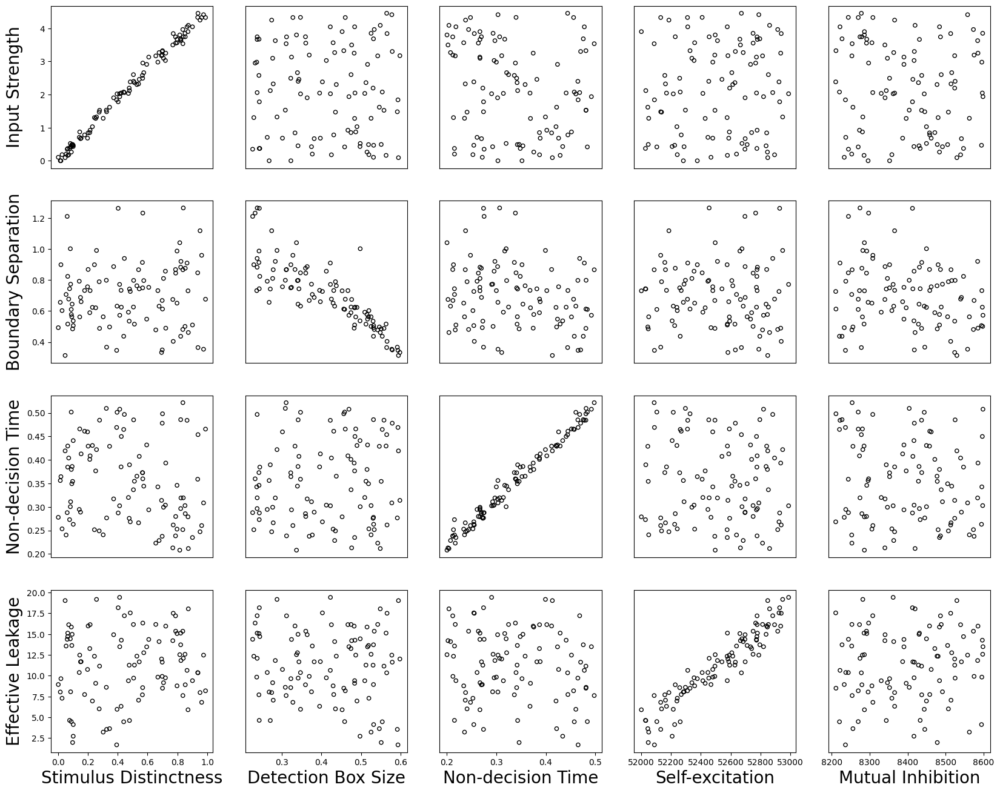

In [5]:
#Bns = 2000, Bs = 500, dx = 0.01, dt = 0.01, k = +-20
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

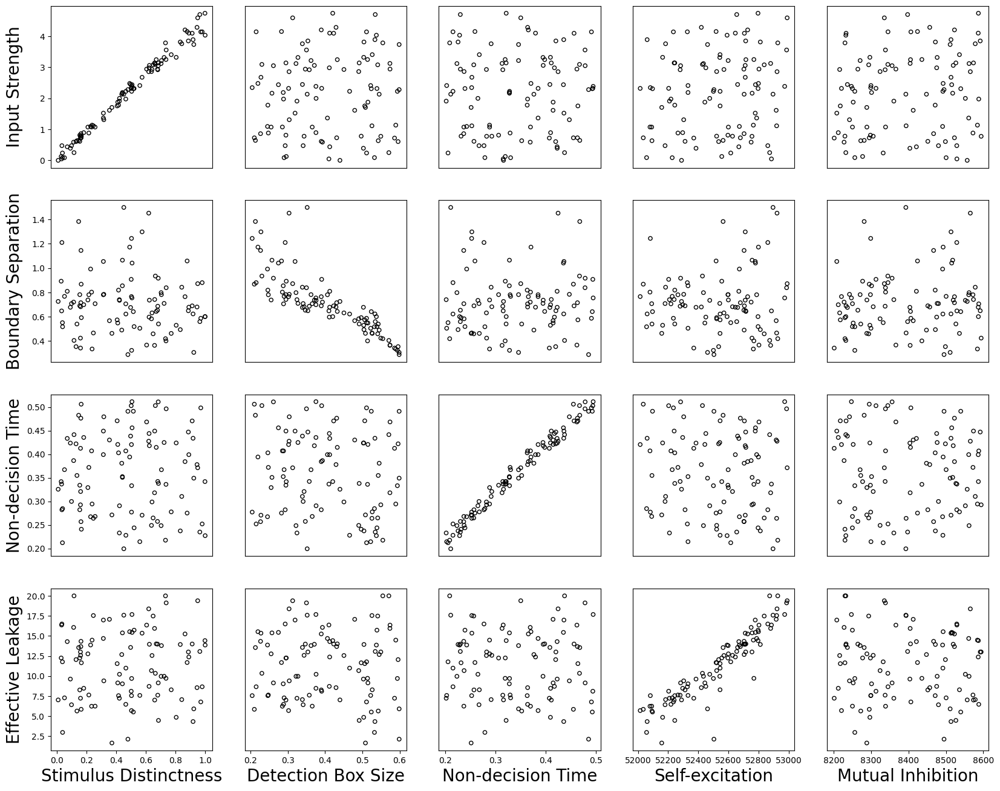

In [70]:
#Bns = 2000, Bs = 500, dx = 0.01, dt = 0.01, k = +-20
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

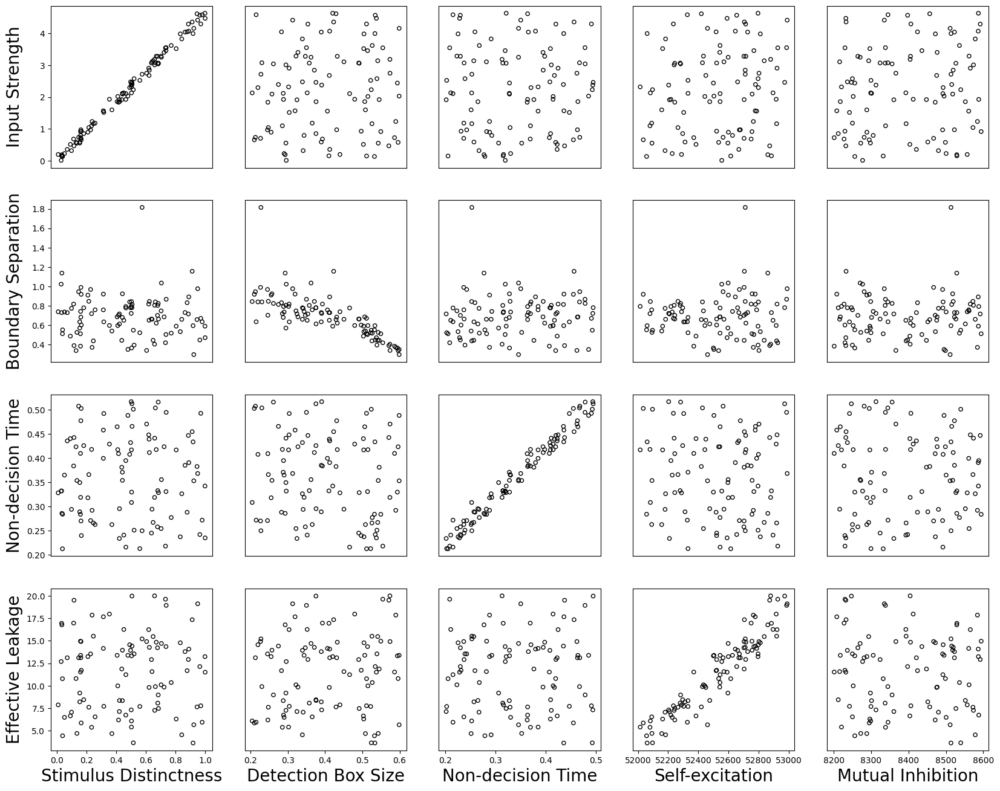

In [68]:
#Bns = 2000, Bs = 500, dx = 0.01, dt = 0.01, k = +-20
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

In [ ]:
#Bns = 1500, Bs = 700, dx = 0.001, dt = 0.001, k = +-10
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

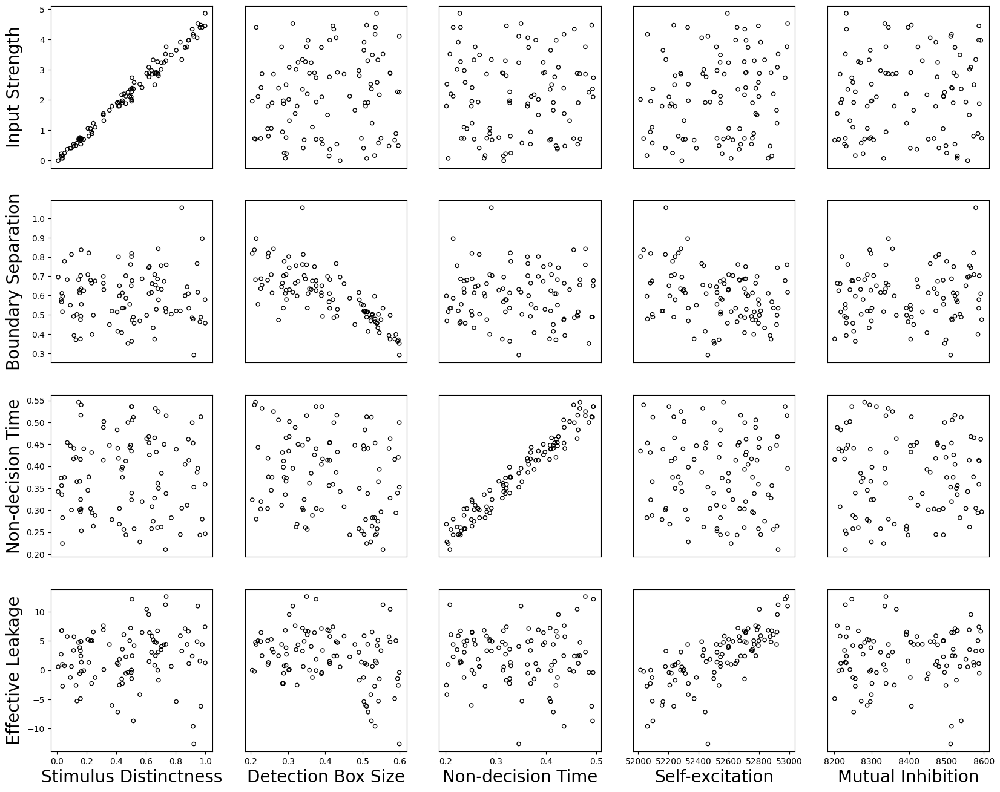

In [63]:
#Bns = 1500, Bs = 700, dx = 0.01, dt = 0.01, k = +-10
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

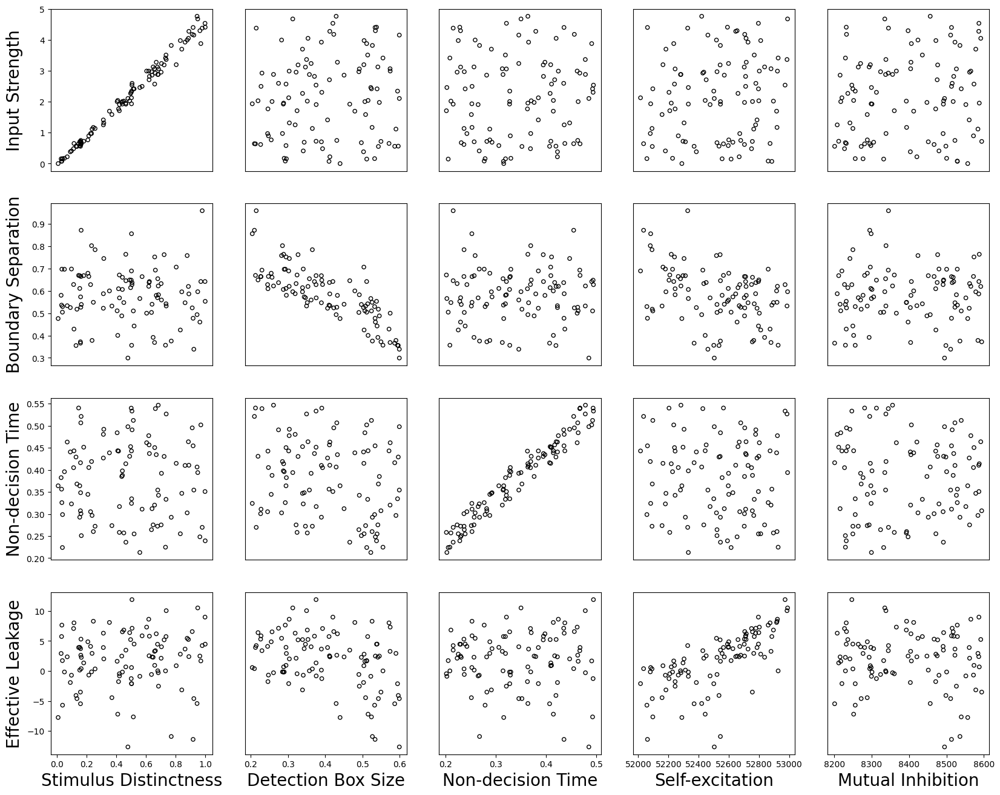

In [61]:
#Bns = 1500, Bs = 700, dx = 0.01, dt = 0.01, k = +-15
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

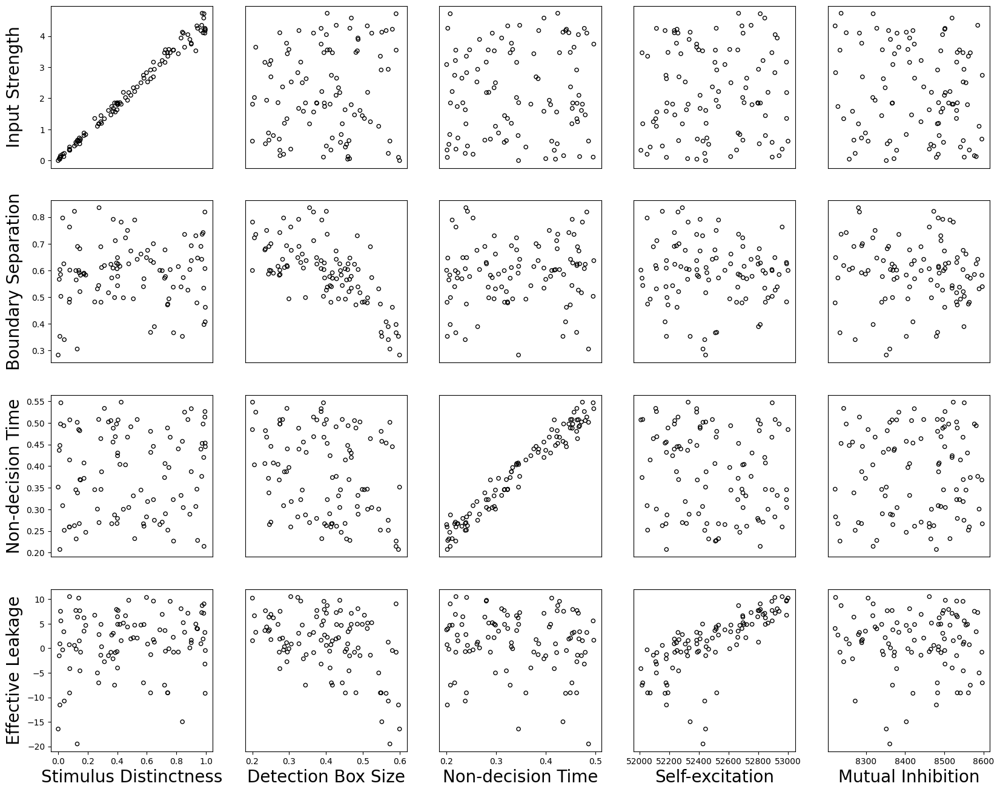

In [55]:
#Bns = 1500, Bs = 500, dx = 0.01, dt = 0.01
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

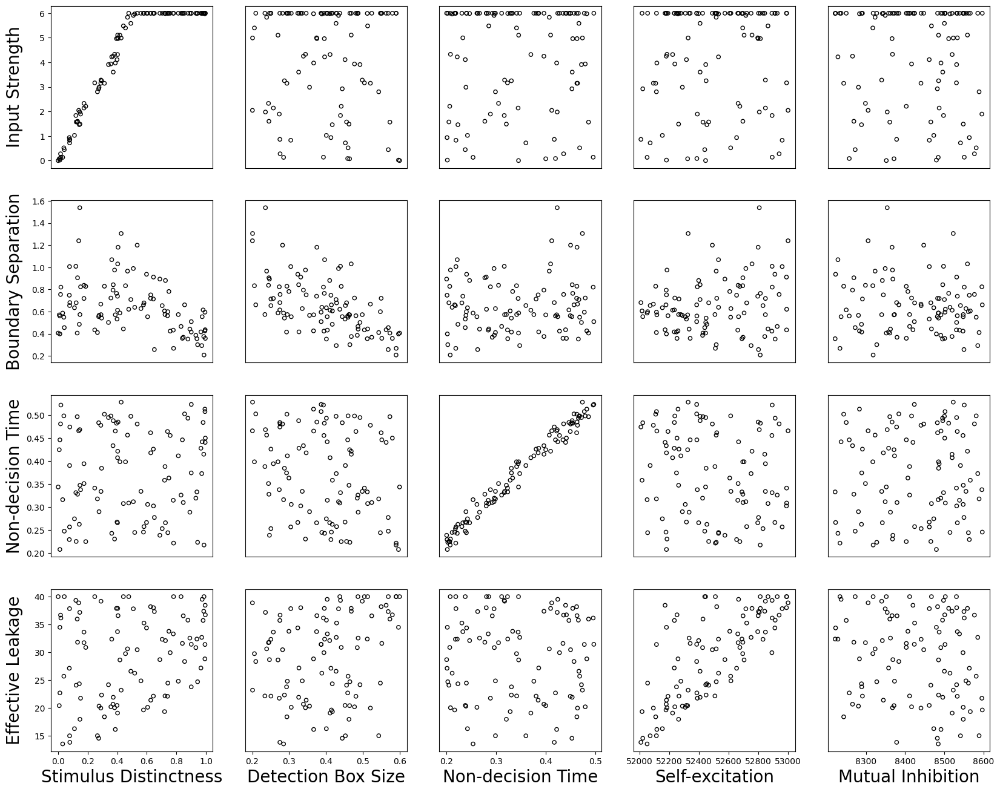

In [53]:
#Bns = 2000, Bs = 1000, dx = 0.01, dt = 0.01
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

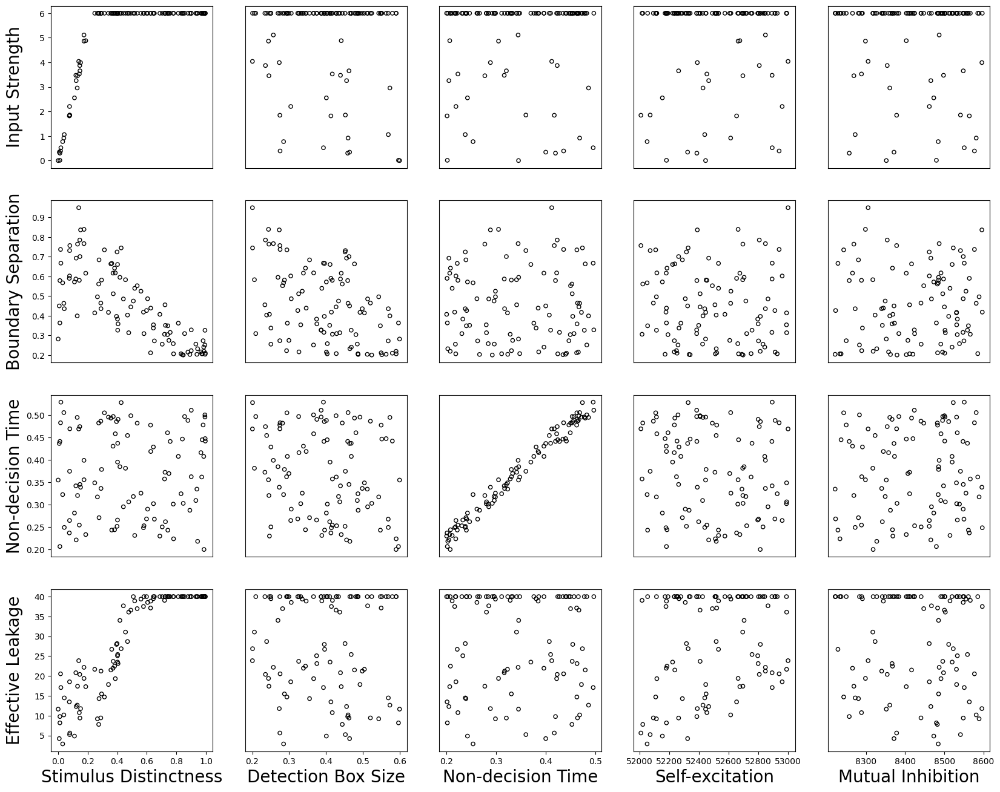

In [50]:
#Bns = 0, Bs = 2500, dx = 0.01, dt = 0.01
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

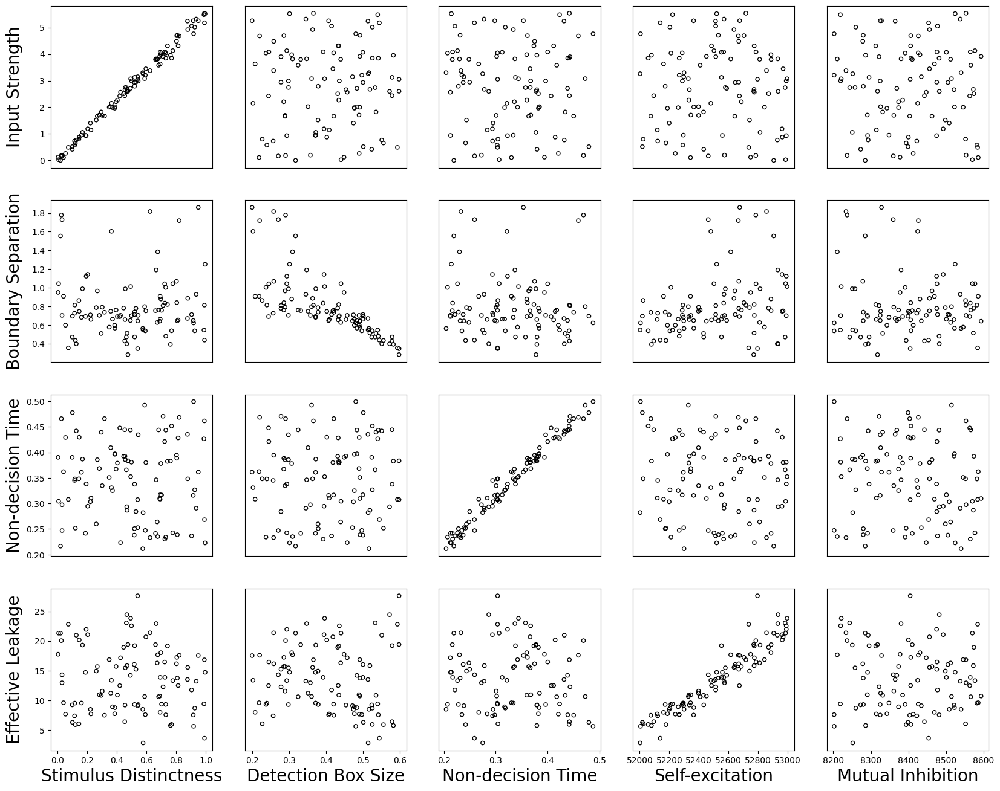

In [41]:
#Bns = 2000, Bs = 600, dx = 0.001, dt = 0.001
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

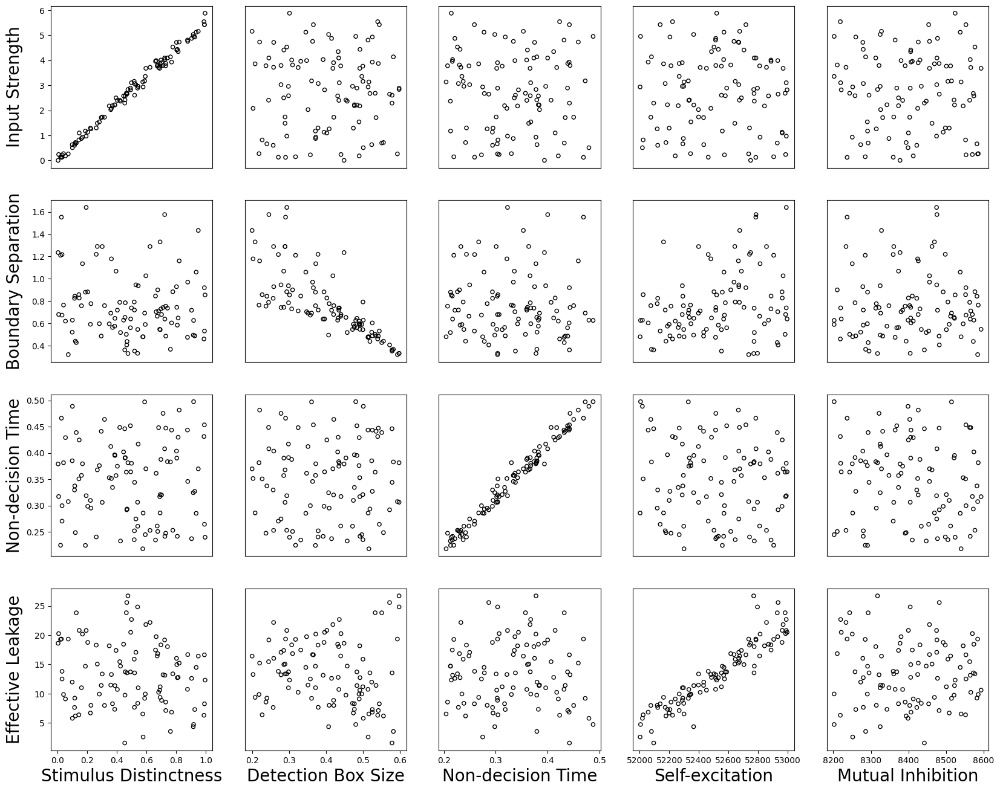

In [39]:
#Bns = 2000, Bs = 600, dx = 0.01, dt = 0.001
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

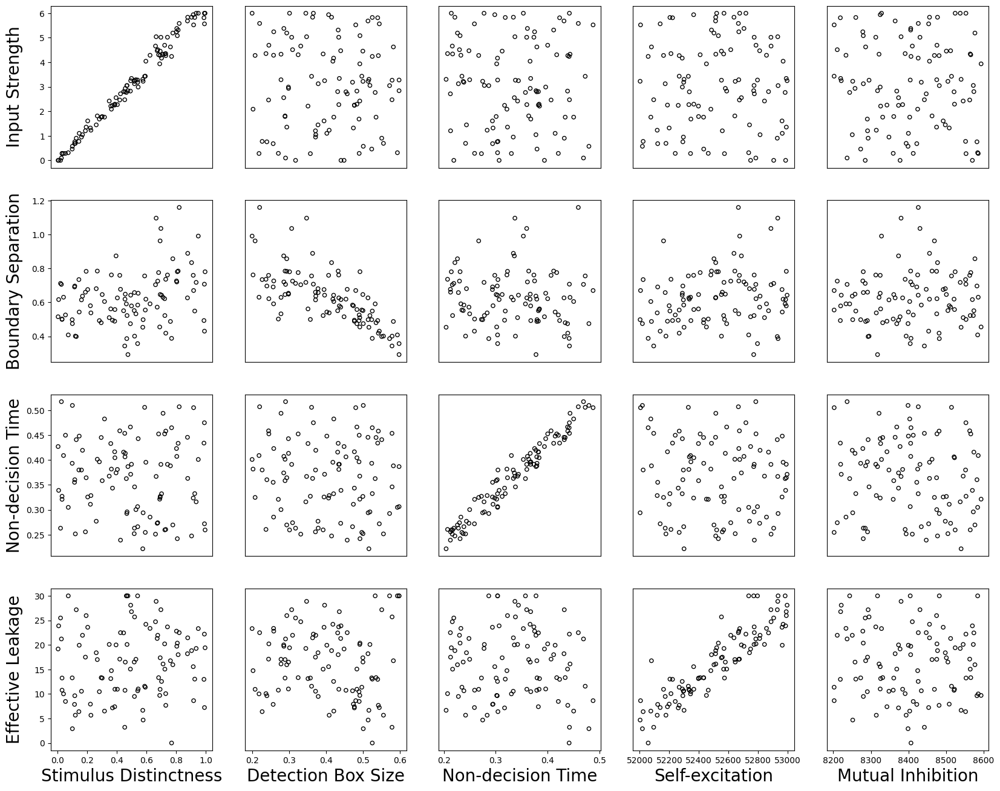

In [37]:
#Bns = 2000, Bs = 600
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

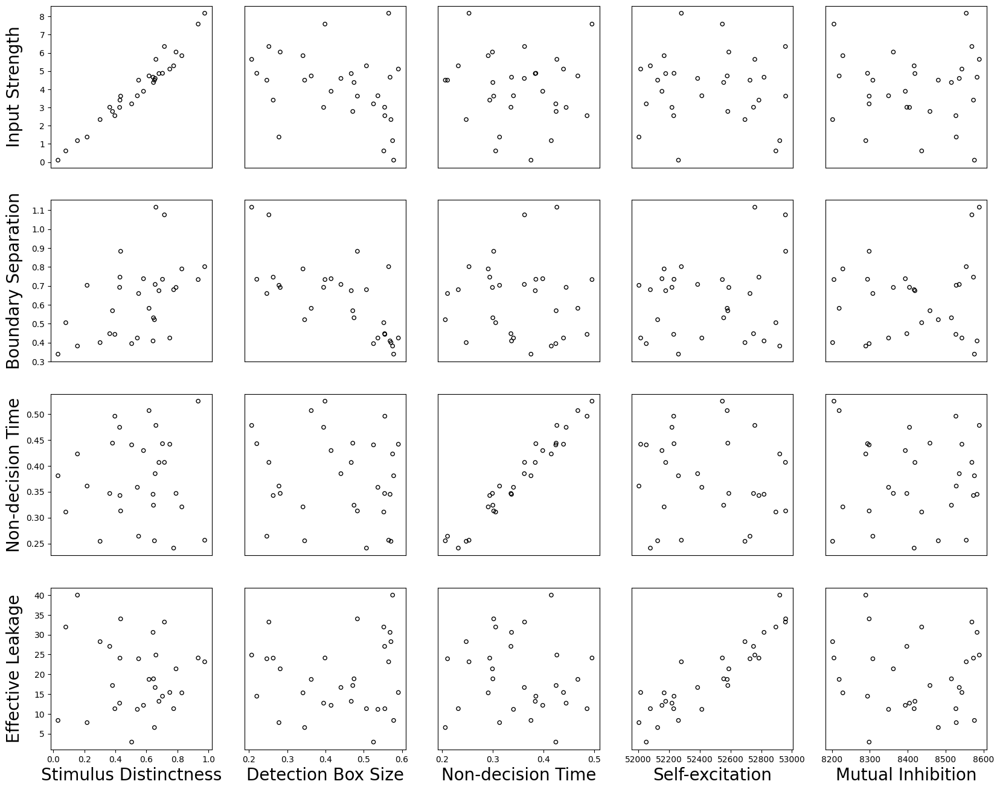

In [17]:
#Bns = 2000, Bs = 1000
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize = 20, s = 20, figsize=(20,16))

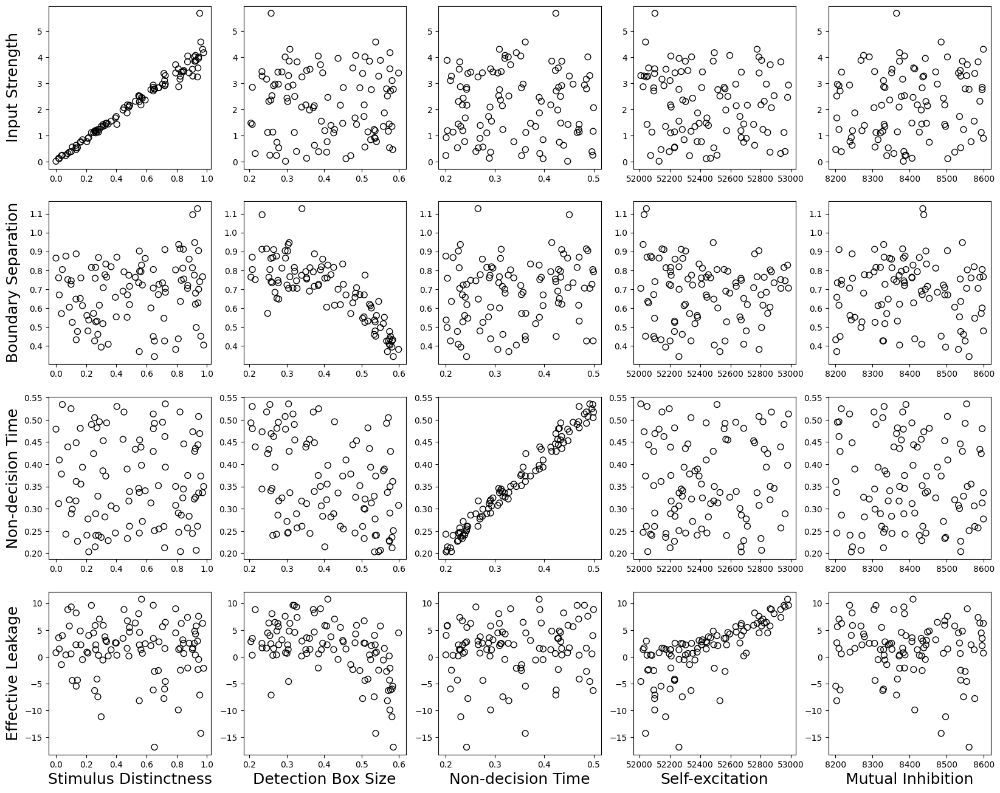

In [78]:
#Bns = 1500, Bs = 500, drift rate 0-8
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, s = 50, figsize=(20,16))

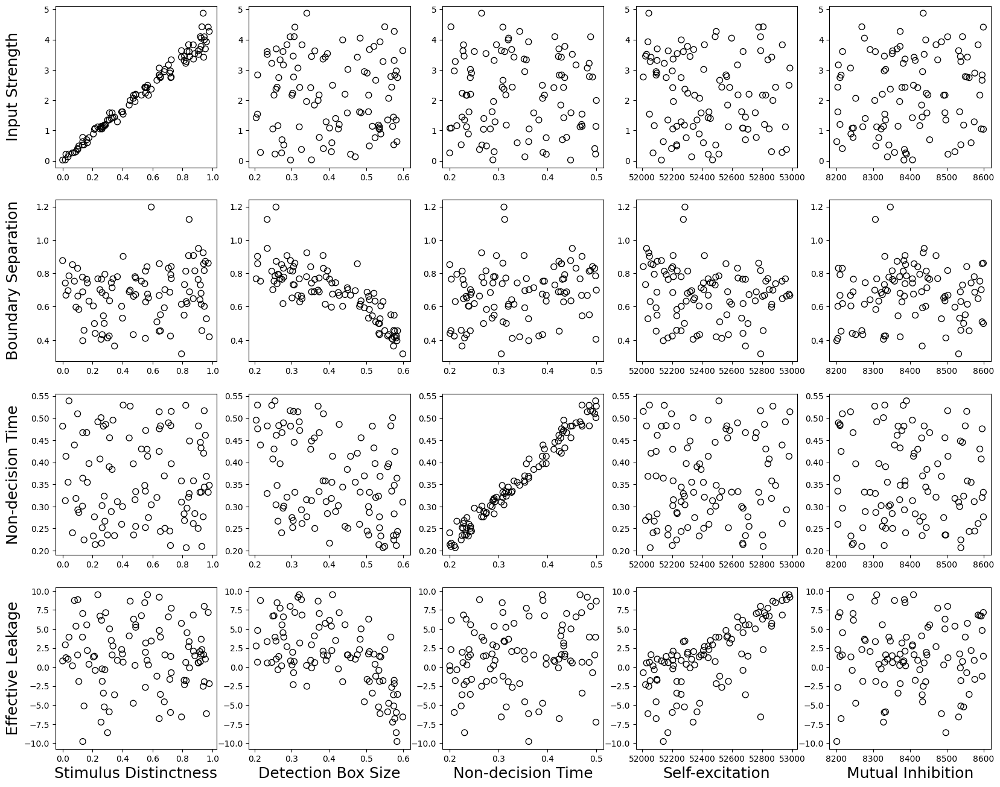

In [89]:
#Bns = 1500, Bs = 500 n_sim = 100 k = -10 - +10
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, s = 50, figsize=(20,16))

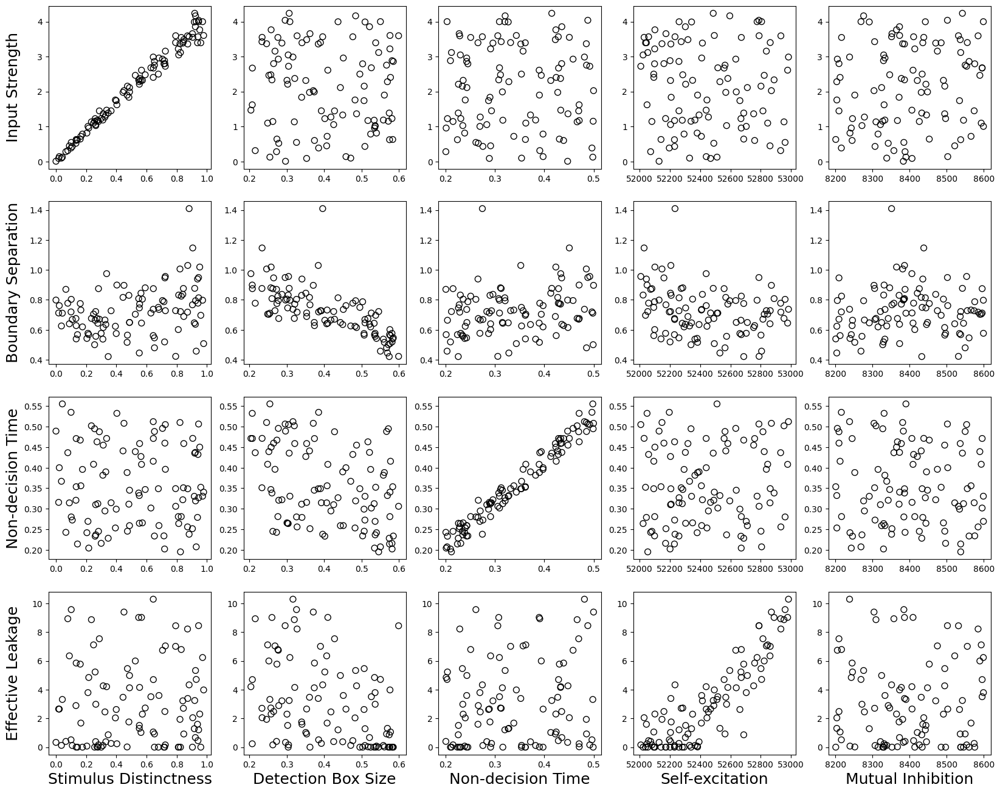

In [87]:
#Bns = 1500, Bs = 500 n_sim = 100 k = 0-40
par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, s = 50, figsize=(20,16))

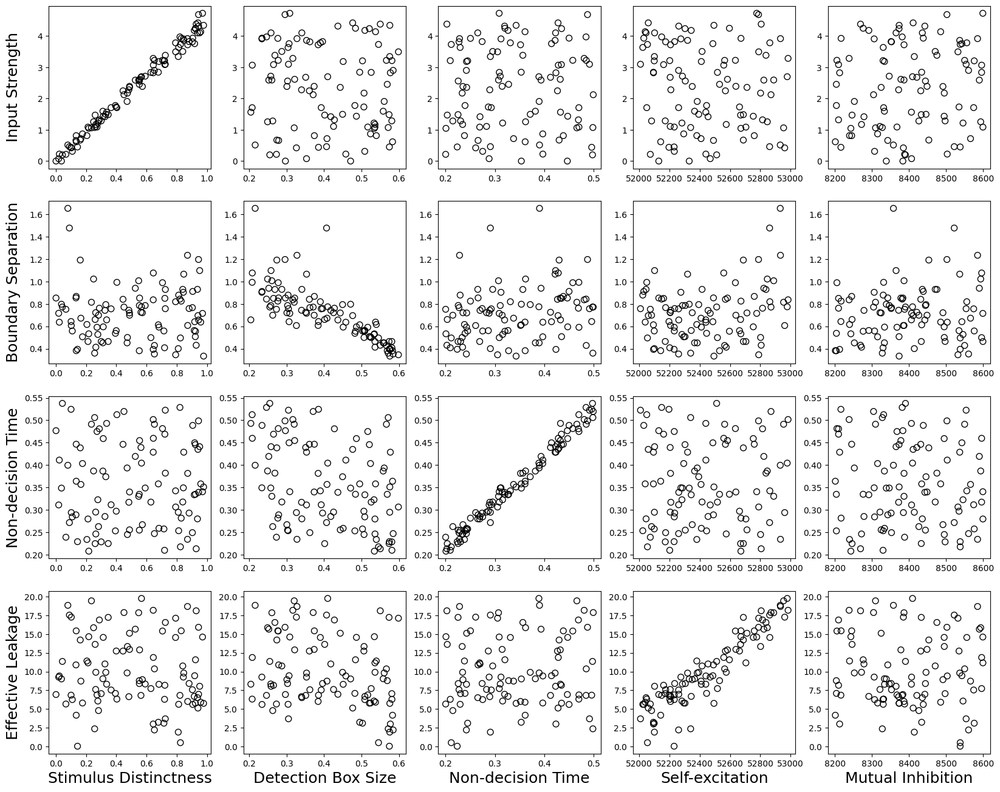

In [95]:
#Bns = 2000, Bs = 500, k = 0-20

par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, s = 50, figsize=(20,16))

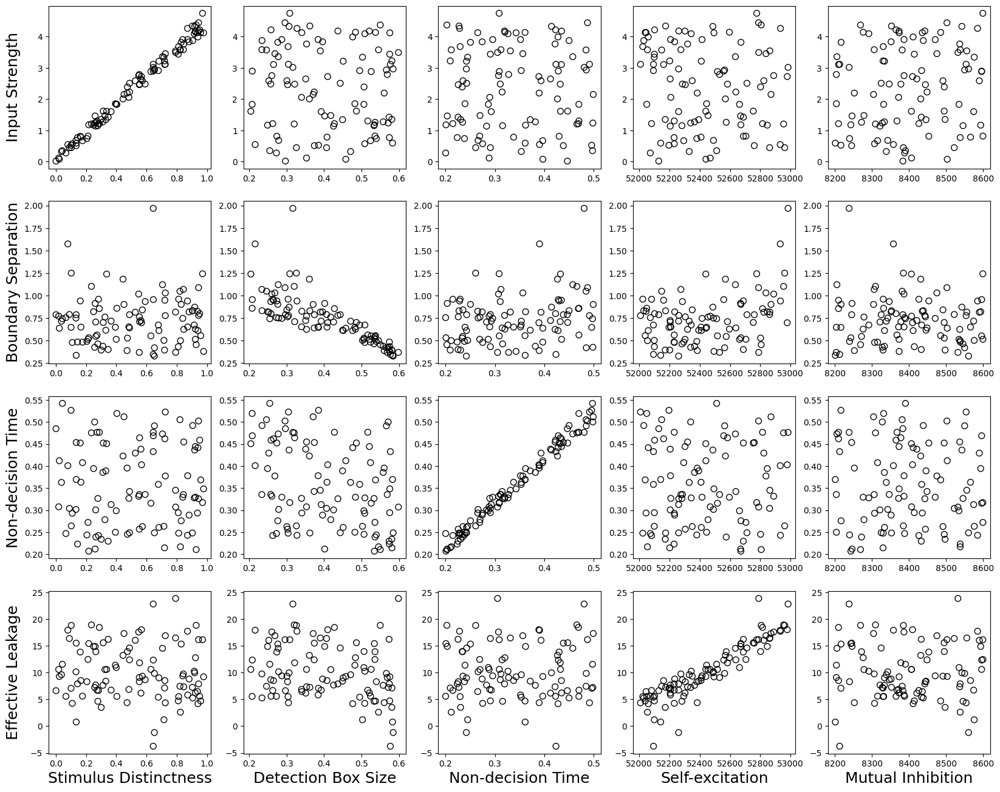

In [93]:
#Bns = 2000, Bs = 500, k = +- 30

par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, s = 50, figsize=(20,16))

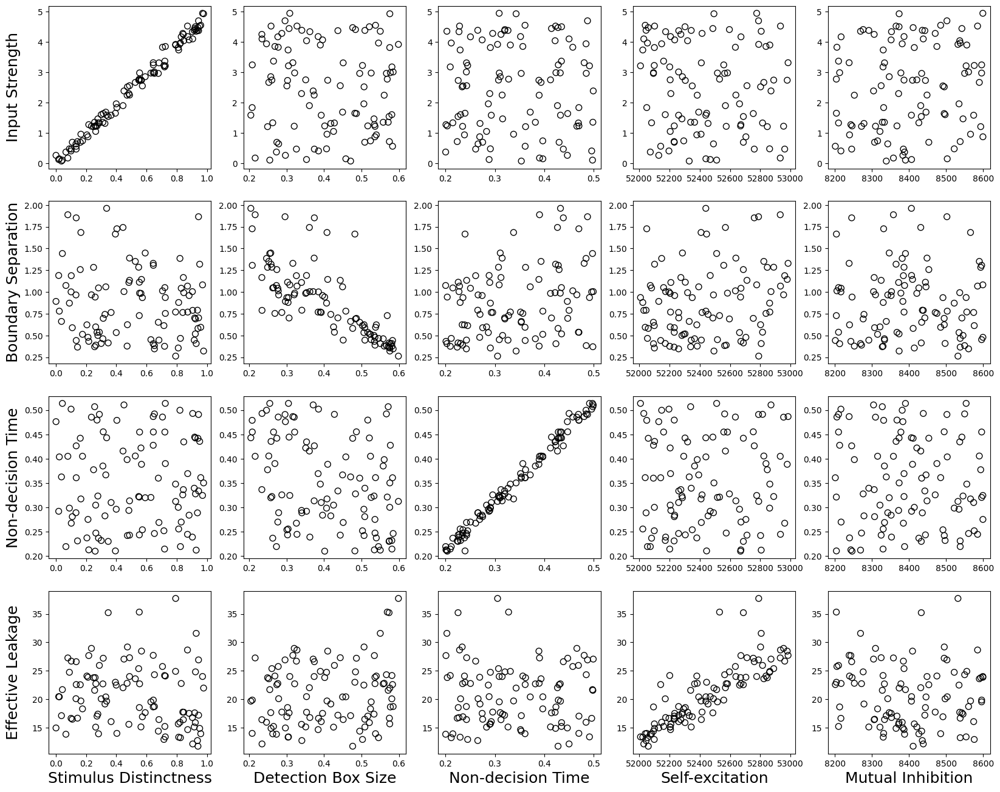

In [84]:
#Bns = 2500, Bs = 500 n_sim = 100 k = 0-40

par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, s = 50, figsize=(20,16))

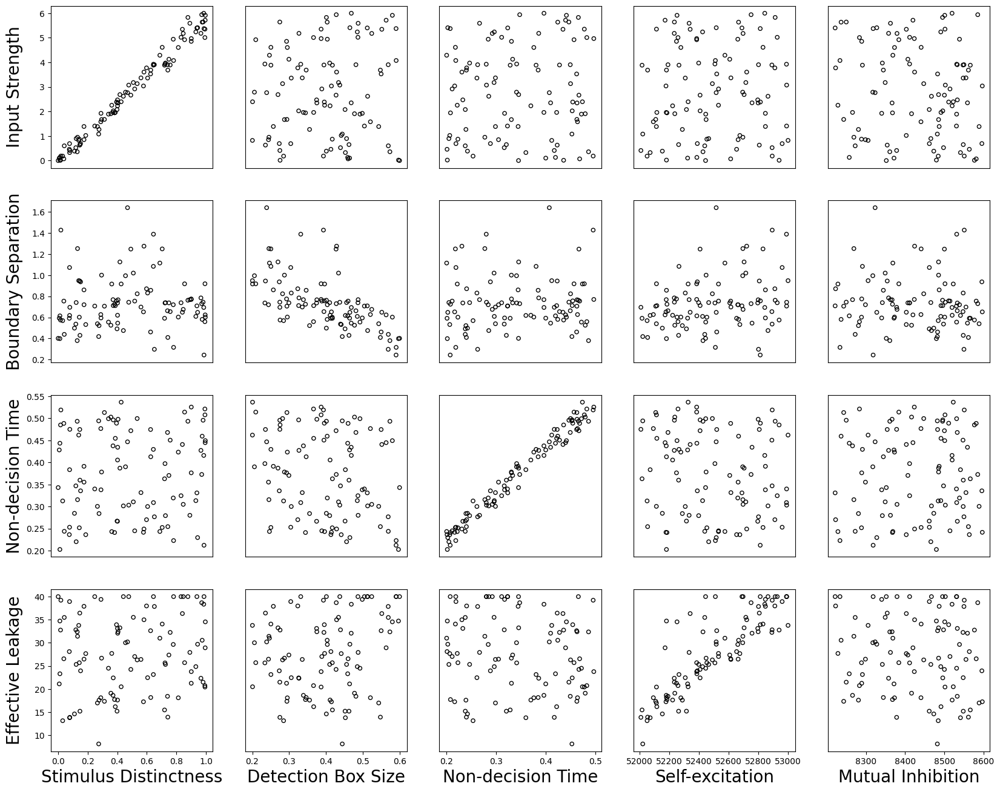

In [48]:
#Bns = 2500, Bs = 500 n_sim = 100 k = +-40, dt dx = 0.01

par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize= 20, s = 20, figsize=(20,16))

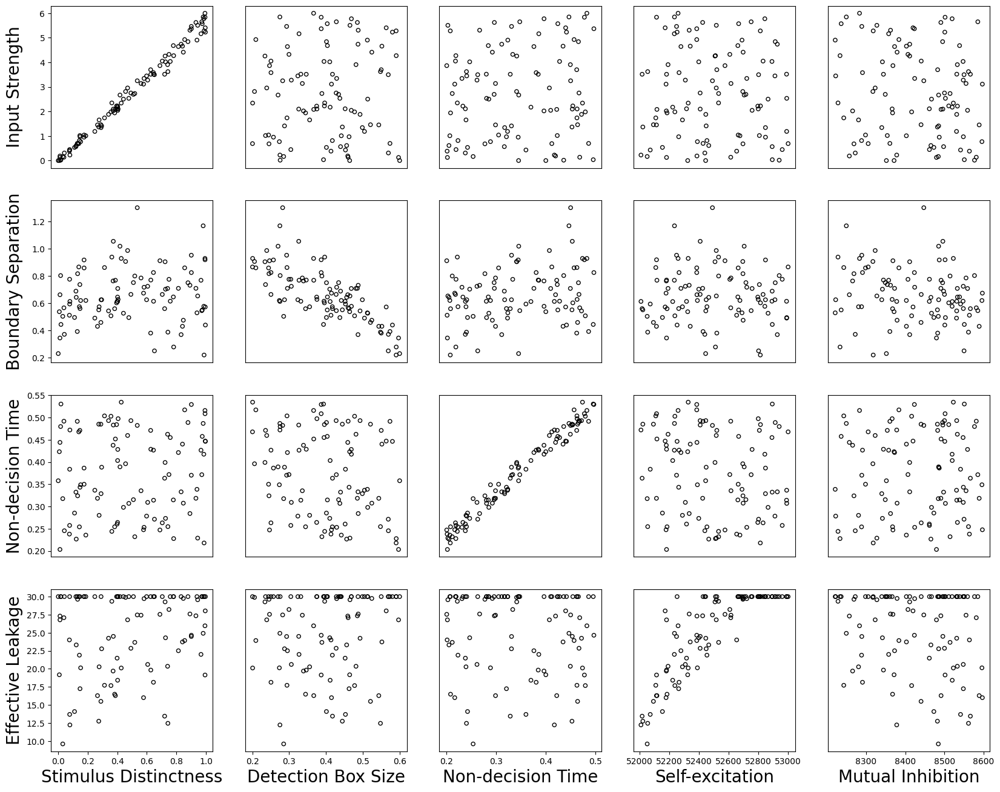

In [46]:
#Bns = 2500, Bs = 500 n_sim = 100 k = +-30, dt dx = 0.01

par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, fontsize= 20, s = 20, figsize=(20,16))

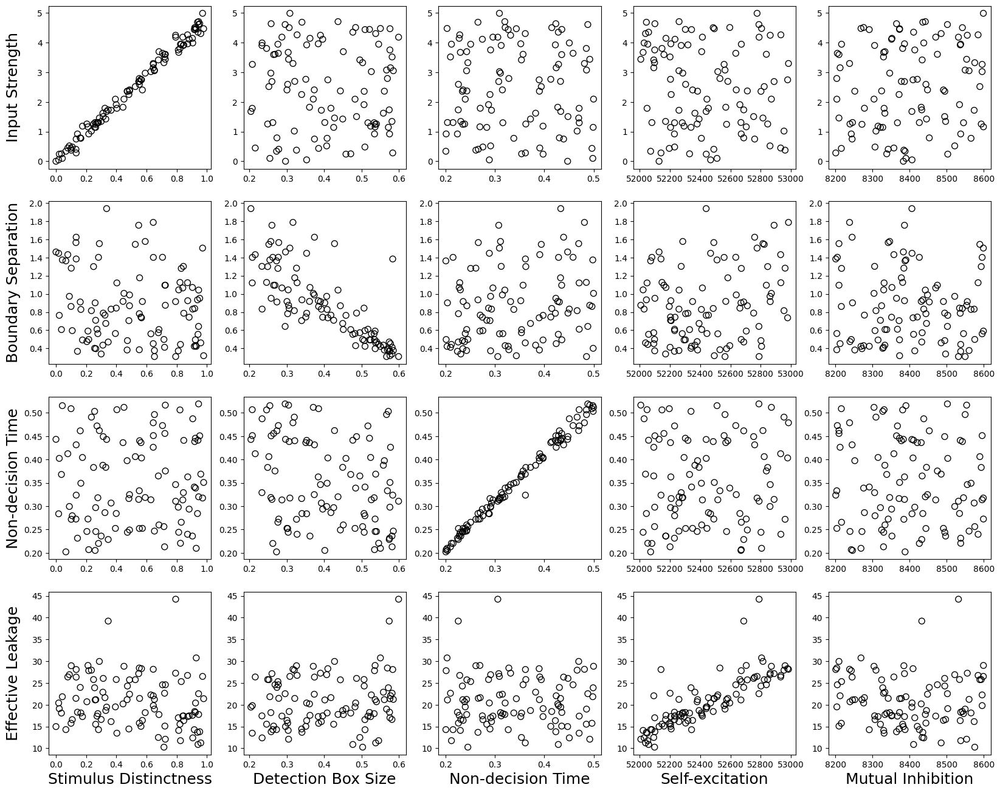

In [75]:
#Bns = 2500, Bs = 500 n_sim = 100 k = +- 50

par_labels = ["Stimulus Distinctness", "Detection Box Size", "Non-decision Time","Self-excitation", "Mutual Inhibition"]
par_fitted_labels = ["Input Strength","Boundary Separation","Non-decision Time", "Effective Leakage"]
sim_fit_plot_all(np.delete(arr=param_IDM, obj = 3, axis = 1), par_fitted[:,:], par_labels, par_fitted_labels, s = 50, figsize=(20,16))

In [120]:
par_fitted_copy = par_fitted.copy()
param_IDM_copy = np.array((param_IDM)).copy()